# Spatial-Temporal Patterns of Drug-Related Crimes in New York City: A Comprehensive Data Analysis
#### Proposal
As you are aware, drug-related crimes have been a persistent issue in urban areas,
including New York City. Understanding the dynamics and patterns of these crimes can have
significant implications for law enforcement and policymakers. Research in this field can
provide insights into the underlying factors of drug-related crimes in NYC.

Our project proposal aims to explore the trends and patterns in drug crimes in NYC using
available data that includes the precincts where these crimes occurred, the specific time of when
they occured, when the crime was reported, descriptions and levels of offense, whether the
crime was successfully completed, latitude-longitude coordinates, and more.

Also, we will investigate the correlation between the crimes and other factors, like
geography, population, race, and compare the difference between districts. We aim to identify
geographical hotspots and coldspots of drug-related crimes within NYC, using provided data that
includes lat-lon coordinates. We will examine temporal patterns to understand when drug-related
crimes are more likely to occur during the day, which can shed light on potential contributing
factors. We intend to categorize drug-related offenses by type and severity, offering a deeper
understanding of the nature of these crimes in the city.

Our project will involve data cleaning and preprocessing to ensure data quality and
accuracy. Multiple columns/features in the dataset have NaNs or ambiguous values (precinct #),
and we will deal with this appropriately. We will use various data analysis techniques, including
spatial analysis, time series analysis, and data visualization, to achieve the project’s objectives.

#### Data Sources
* [Drug Crime | NYC Open Data](cityofnewyork.us)  
* [BYTES of the BIG APPLE - DCP](nyc.gov)  
* [2020 Census - DCP](nyc.gov)  
* [Community Districts Geospacial](https://data.cityofnewyork.us/City-Government/Community-Districts/yfnk-k7r4)
* [Borough Boundaries Geospacal](https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm)

# Notebook Setup

In [1]:
# Imports
import plotly.graph_objects as go
import seaborn as sns
import preprocess_utils as pu
import data_utils as du
import pandas as pd
import numpy as np
import folium
import json
import statistics
from plotly.subplots import make_subplots
from matplotlib import pyplot as plt
from shapely.geometry import Point, Polygon, MultiPolygon

# Preprocessing and Preprocessing Visualizations

**File Loading and Automated Preprocessing**

In [2]:
# Load in Drug_Crime and Census data
raw_datasets = du.import_csv_data()
datasets = pu.preprocess_datasets(raw_datasets)  # Indices: 'Drug_Crime', 'Census'

# Load GeoJSON data for NYC community districts
with open('data/City_Features/Community_Districts.geojson', 'r') as f:
    NYC_district = json.load(f)
    
# Load GeoJSON data for NYC borough
with open('data/City_Features/Borough_Boundaries.geojson', 'r') as f:
    NYC_borough = json.load(f)
    
# Load in District 2020 Population Data
population_df = pd.read_excel('data/Population_by_District.xlsx')

# Read Housng Prices (2015, Midpont) Data
house_df_queens = pd.read_excel('data/Housing_Prices/2015_queens.xls',skiprows=4)
house_df_statenisland = pd.read_excel('data/Housing_Prices/2015_statenisland.xls',skiprows=4)
house_df_manhattan = pd.read_excel('data/Housing_Prices/2015_manhattan.xls',skiprows=4)
house_df_brooklyn = pd.read_excel('data/Housing_Prices/2015_brooklyn.xls',skiprows=4)
house_df_bronx = pd.read_excel('data/Housing_Prices/2015_bronx.xls',skiprows=4)

### Cleaning via Visualizations - Dropping Years with Insufficent Data

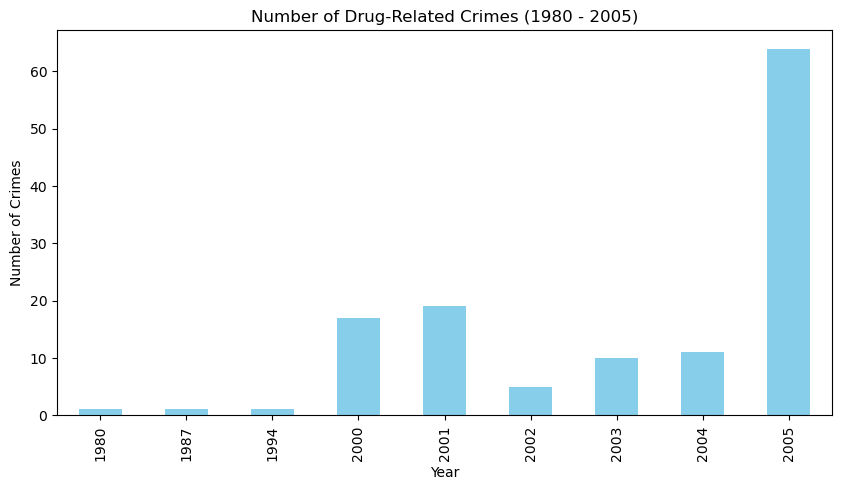

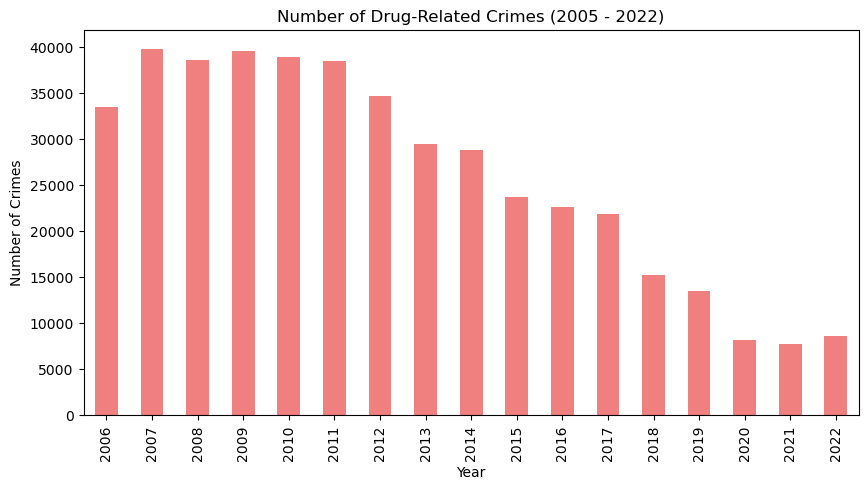

In [3]:
# Fill or drop missing values in 'Year' column
datasets['Drug_Crime']['Year'] = datasets['Drug_Crime']['Year'].fillna(0).astype(int)

# Filter data for the time period 1980 - 2005
subset_1980_2005 = datasets['Drug_Crime'][(datasets['Drug_Crime']['Year'] >= 1980) & (datasets['Drug_Crime']['Year'] <= 2005)]

# Filter data for the time period 2005 - 2022
subset_2006_2022 = datasets['Drug_Crime'][datasets['Drug_Crime']['Year'] > 2005]

# Plotting bar graph for 1980 - 2005
plt.figure(figsize=(10, 5))
subset_1980_2005['Year'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Number of Drug-Related Crimes (1980 - 2005)')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.show()

# Plotting bar graph for 2006 - 2022
plt.figure(figsize=(10, 5))
subset_2006_2022['Year'].value_counts().sort_index().plot(kind='bar', color='lightcoral')
plt.title('Number of Drug-Related Crimes (2005 - 2022)')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.show()

In [4]:
# Drop all rows before 2006 due to lack of sufficient data as shown in visualization
datasets['Drug_Crime'] = datasets['Drug_Crime'].drop(datasets['Drug_Crime'][datasets['Drug_Crime']['Year'] < 2006].index)

### Cleaning via Visualizations - Coorelation Analysis and Filling Missinig Borough Info

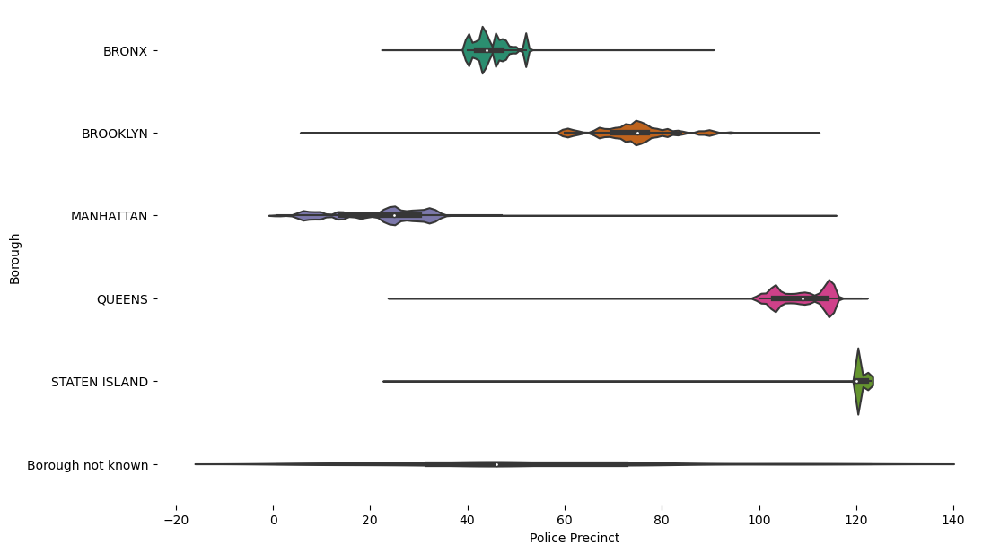

In [5]:
# Set the size of the plot
figsize = (12, 1.2 * len(datasets['Drug_Crime']['BORO_NM'].unique()))

# Create the plot
plt.figure(figsize=figsize)

# Plot the violin plot
sns.violinplot(data=datasets['Drug_Crime'], x='Precinct', y='BORO_NM', inner='box', palette='Dark2')

# Remove spines for a cleaner look
sns.despine(top=True, right=True, bottom=True, left=True)

# Rename x and y-axis
plt.xlabel('Police Precinct')
plt.ylabel('Borough')

# Show the plot
plt.show()

In [6]:
# Clean missing boroughs and drop any un-associated data values
datasets['Drug_Crime'] = pu.clean_missing_boroughs(datasets['Drug_Crime'])

In [7]:
# Isolate by Borough
total_census = datasets['Census'].iloc[:][0:6].set_index('Borough', drop=False)

# Filter census 2010 Population
filtered_census_10 = du.filter_by_boro_feature(total_census, feature='Pop_10')
filtered_all_10 = pd.DataFrame(filtered_census_10['All'])
filtered_race_10 = filtered_census_10.drop(columns=['All'])

# Filter census 2010 Population
filtered_census_20 = du.filter_by_boro_feature(total_census, feature='Pop_20')
filtered_all_20 = pd.DataFrame(filtered_census_20['All'])
filtered_race_20 = filtered_census_20.drop(columns=['All'])

# Noramalize all rows to between 0-1 via the euclidean norm
filtered_race_10_rnorm = du.normalize(filtered_race_10)
filtered_race_20_rnorm = du.normalize(filtered_race_20)

# Drug Crime Visualizations (ONLY)

### Fluctuation of Crime Since 2006

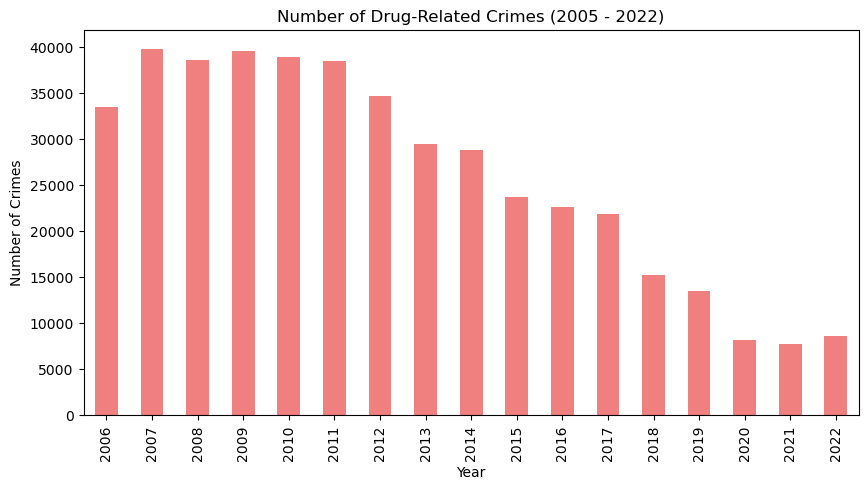

In [8]:
# Plotting bar graph for 2006 - 2022
plt.figure(figsize=(10, 5))
subset_2006_2022['Year'].value_counts().sort_index().plot(kind='bar', color='lightcoral')
plt.title('Number of Drug-Related Crimes (2005 - 2022)')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.show()

### Fluctuation of Crime Throughout the Year In Months

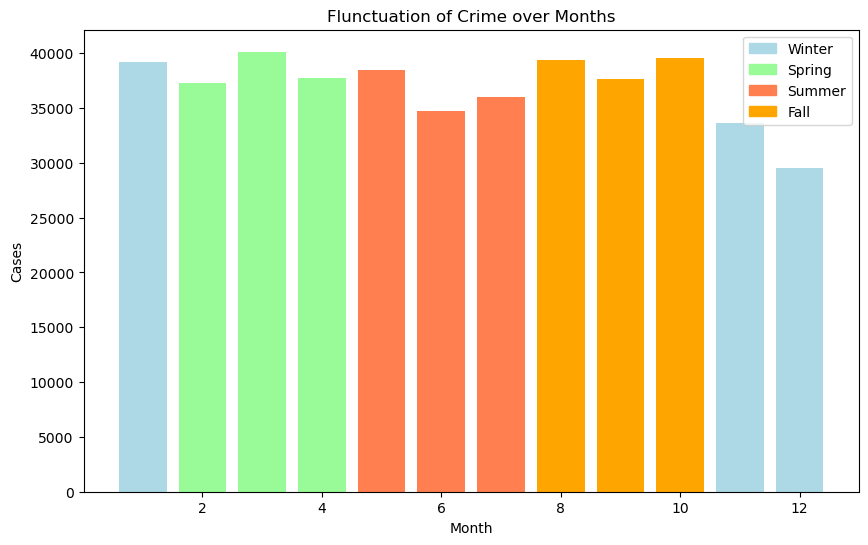

In [9]:
months = (datasets['Drug_Crime'].groupby("Month").count())["Year"].to_dict()
colors = ["lightblue" if month in [11,12,1] else "palegreen" 
          if month in [2,3,4] else "coral" if month in [5,6,7] else "orange" for month in months.keys()]

plt.figure(figsize=(10,6))
plt.title("Flunctuation of Crime over Months")
plt.xlabel("Month")
plt.ylabel("Cases")

legend_colors = {'Winter': 'lightblue', 'Spring':'palegreen', 'Summer': 'coral', 'Fall': 'orange'}
handles = [plt.Rectangle([0, 0], 0, 0, color=legend_colors[key]) for key in legend_colors.keys()] # Reference: https://matplotlib.org/3.1.1/tutorials/intermediate/legend_guide.html
plt.bar(list(months.keys()), list(months.values()), color = colors)
plt.legend(handles, legend_colors.keys())
plt.show()

### Fluctuation of Crime Throughout the Day

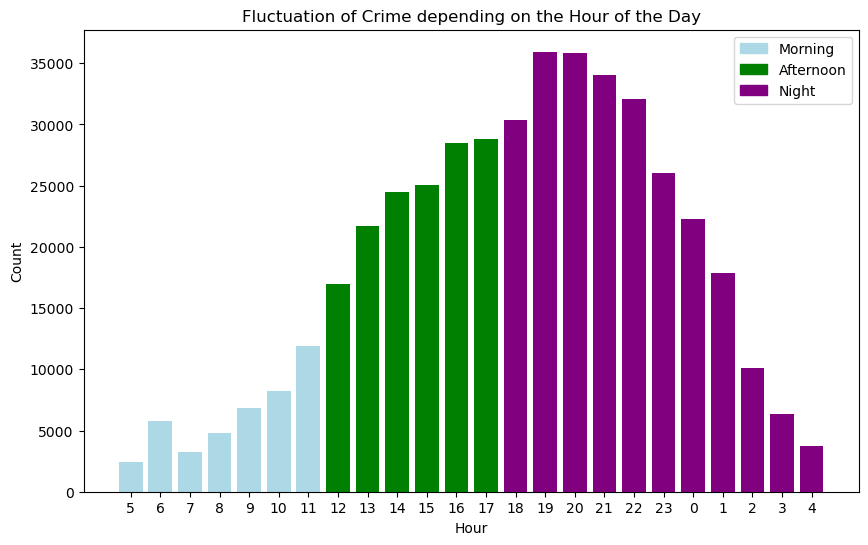

In [10]:
hours = du.count_time_part(datasets['Drug_Crime']['Time'], times={'hour': 5})['hour']
hours = {str(key): value for key, value in hours.items()}

colors = ['lightblue' if 5 <= int(hour) < 12 else 'green' if 12 <= int(hour) < 18 else 'purple' for hour in hours.keys()]

legend_colors = {'Morning': 'lightblue', 'Afternoon':'green', 'Night': 'purple'}
handles = [plt.Rectangle([0, 0], 0, 0, color=legend_colors[key]) for key in legend_colors.keys()] 

plt.figure(figsize = (10, 6))
plt.title("Fluctuation of Crime depending on the Hour of the Day")
plt.ylabel("Count")
plt.xlabel("Hour")
plt.bar(list(hours.keys()), list(hours.values()), color = colors)
plt.legend(handles, legend_colors.keys())

plt.show()

### Identifying Disparities in Drug-Related Crime Severity through Violin Plot

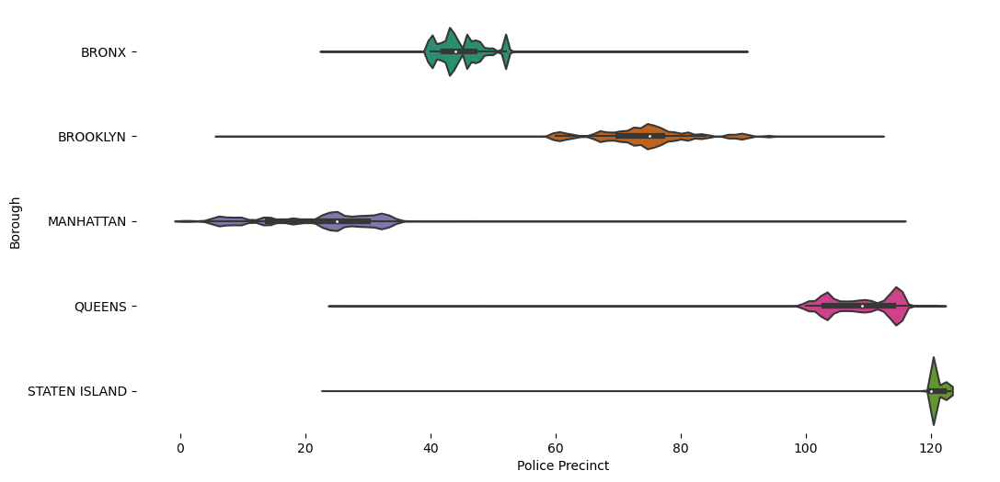

In [11]:
# Set the size of the plot
figsize = (12, 1.2 * len(datasets['Drug_Crime']['BORO_NM'].unique()))

# Create the plot
plt.figure(figsize=figsize)

# Plot the violin plot
sns.violinplot(data=datasets['Drug_Crime'], x='Precinct', y='BORO_NM', inner='box', palette='Dark2')

# Remove spines for a cleaner look
sns.despine(top=True, right=True, bottom=True, left=True)

# Rename x and y-axis
plt.xlabel('Police Precinct')
plt.ylabel('Borough')

# Show the plot
plt.show()

### Identifying High-Risk Areas for Drug-Related Incidents in NYC through Heat Map

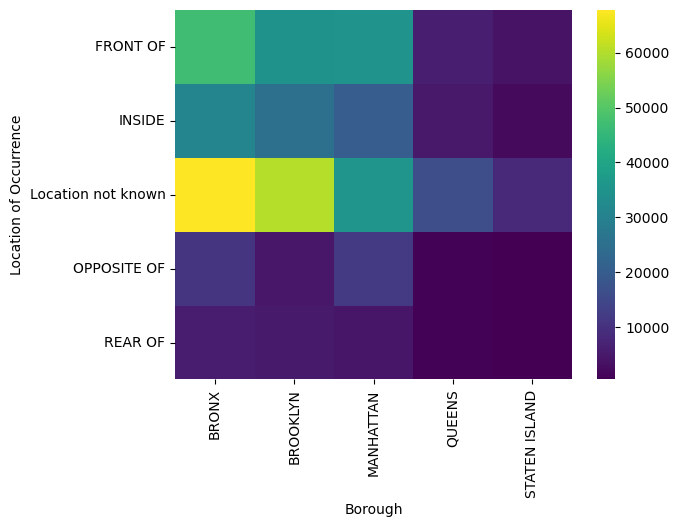

In [12]:
# Creating a DataFrame for 2D histogram
df_2dhist = pd.DataFrame({
    x_label: grp['LOC_OF_OCCUR_DESC'].value_counts()
    for x_label, grp in datasets['Drug_Crime'].groupby('BORO_NM')
})

# Plotting the heatmap
sns.heatmap(df_2dhist, cmap='viridis')

# Renaming x and y-axis labels
plt.xlabel('Borough')
plt.ylabel('Location of Occurrence')

# Show the plot
plt.show()

<BarContainer object of 4 artists>

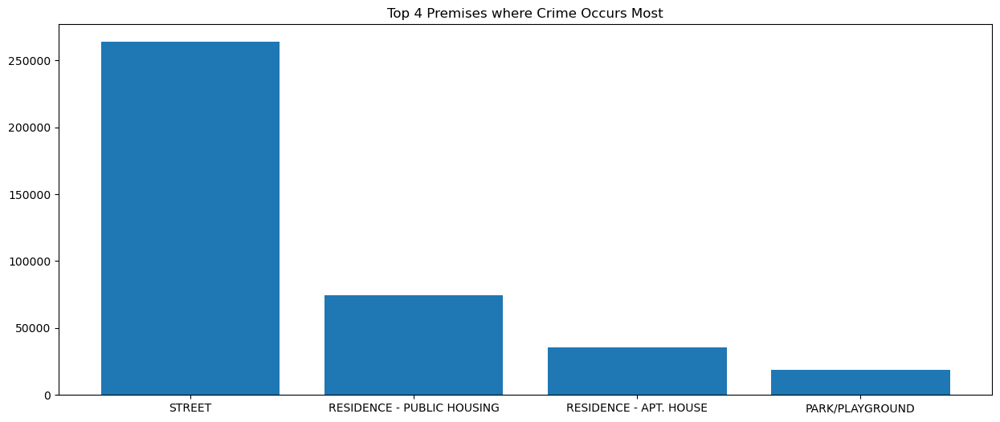

In [13]:
premises = datasets['Drug_Crime']['PREM_TYP_DESC'].value_counts().head(4).to_dict()
plt.figure(figsize = (15, 6))
plt.title("Top 4 Premises where Crime Occurs Most")
plt.bar(list(premises.keys()), list(premises.values()))

### Distribution of Drug-Related Crimes Across Boroughs

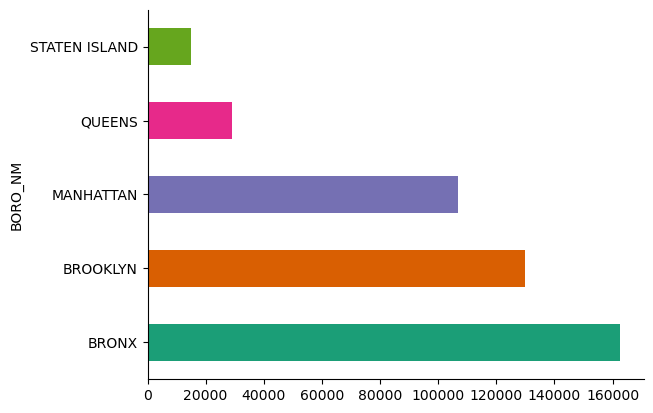

In [14]:
#Generates a horizontal bar plot to show the count of drug-related crimes in each borough using the 'raw_drug_crime' dataset.
datasets['Drug_Crime'].groupby('BORO_NM').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

### Histogram of Drug-Related Crimes Across Precincts (20 Bins)

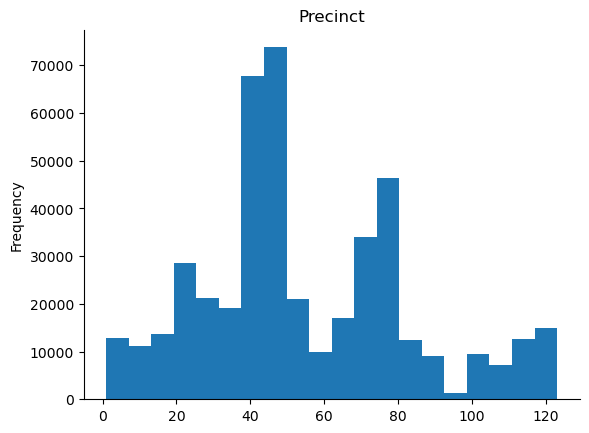

In [15]:
#Generates a histogram of drug-related crimes distributed across precincts with 20 bins.
datasets['Drug_Crime']['Precinct'].plot(kind='hist', bins=20, title='Precinct')
plt.gca().spines[['top', 'right',]].set_visible(False)

### Bar Chart of the Count of Possession and Sale Felones/Midemeanors

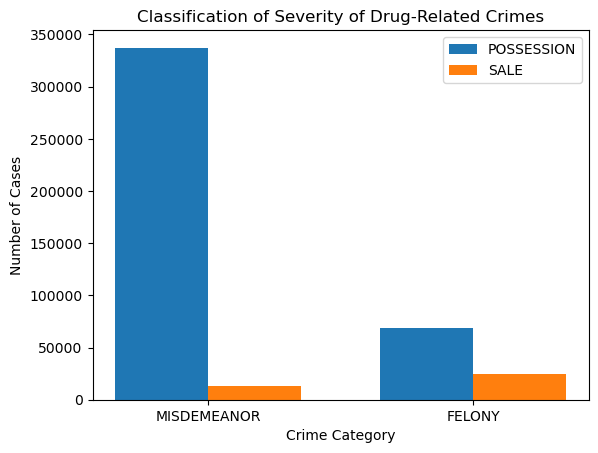

In [16]:
# Isolate all possession and sale crmes
possession_crimes = datasets['Drug_Crime'].loc[datasets['Drug_Crime']['Crime'].str.contains('POSS.')]
sale_crimes = datasets['Drug_Crime'].loc[datasets['Drug_Crime']['Crime'].str.contains('SALE')]

# Data
categories = ['MISDEMEANOR', 'FELONY']
possession_counts = [possession_crimes['Crime Category'].value_counts()['MISDEMEANOR'],
                     possession_crimes['Crime Category'].value_counts()['FELONY']]  
sale_counts = [sale_crimes['Crime Category'].value_counts()['MISDEMEANOR'],
               sale_crimes['Crime Category'].value_counts()['FELONY']]

# Plotting
bar_width = 0.35
index = range(len(categories))

fig, ax = plt.subplots()
possession_bars = ax.bar(index, possession_counts, bar_width, label='POSSESSION')
sale_bars = ax.bar([i + bar_width for i in index], sale_counts, bar_width, label='SALE')

# Labeling
ax.set_xlabel('Crime Category')
ax.set_ylabel('Number of Cases')
ax.set_title('Classification of Severity of Drug-Related Crimes')
ax.set_xticks([i + bar_width / 2 for i in index])
ax.set_xticklabels(categories)
ax.legend()

# Show the plot
plt.show()

### NYC Penal Code Report Counts

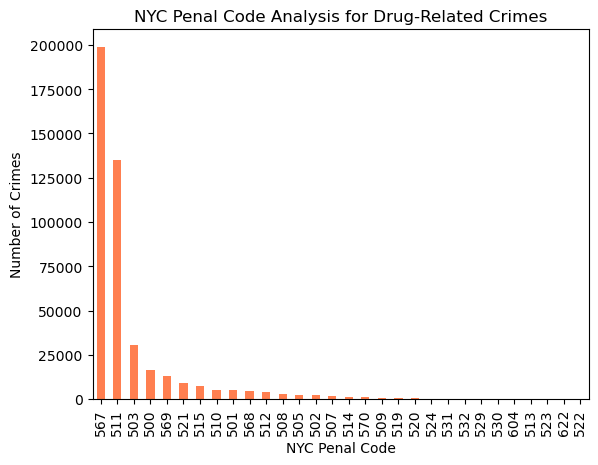

In [17]:
# Analyzing the frequency of different offense codes in drug-related crimes.
offense_code_analysis = datasets['Drug_Crime']['NYC Penal Code'].value_counts()
offense_code_analysis.plot(kind='bar', color='coral')
plt.title('NYC Penal Code Analysis for Drug-Related Crimes')
plt.xlabel('NYC Penal Code')
plt.ylabel('Number of Crimes')
plt.show()

### Using Bar Graph to show the Distribution of Drug Related Crime on Locations

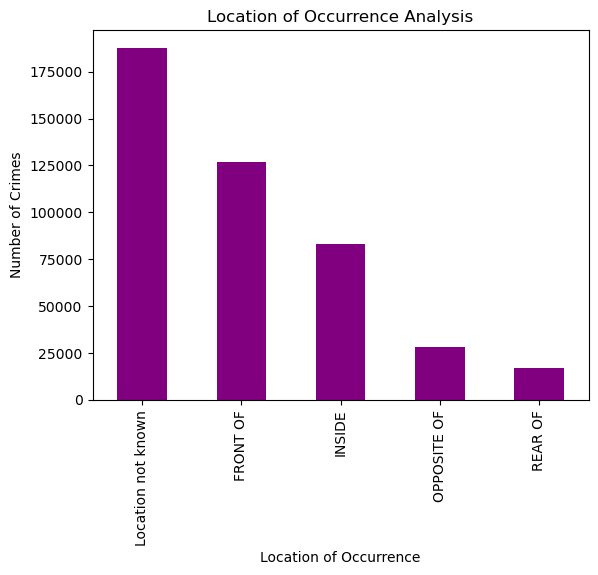

In [18]:
# Investigating the distribution of drug-related crimes based on the location of occurrence.
location_occurrence_analysis = datasets['Drug_Crime']['LOC_OF_OCCUR_DESC'].value_counts()
location_occurrence_analysis.plot(kind='bar', color='purple')
plt.title('Location of Occurrence Analysis')
plt.xlabel('Location of Occurrence')
plt.ylabel('Number of Crimes')
plt.show()

### Count of Crimes Located on Types of Parks

[nltk_data] Downloading package punkt to C:\Users\Pika-
[nltk_data]     Sannnnn\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


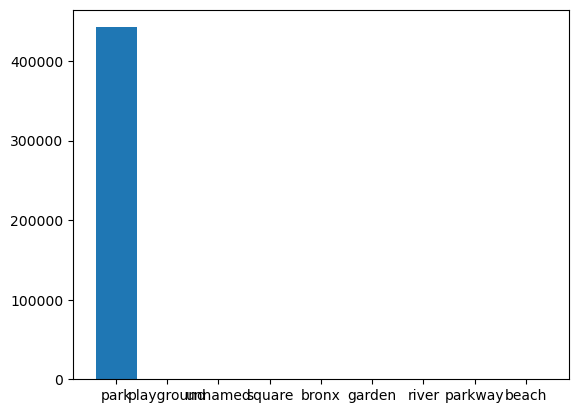

In [19]:
park_locs = du.group_count_parks(datasets['Drug_Crime']['PARKS_NM'])

plt.bar(range(len(park_locs)), list(park_locs.values()), tick_label = list(park_locs.keys()))
plt.show()

### Law Category Anlaysis using Pie Chart for Drug Related Crime

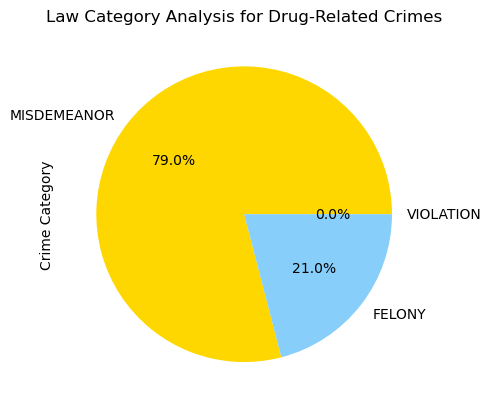

In [20]:
# Analyzing the distribution of drug-related crimes based on law categories.
law_category_analysis = datasets['Drug_Crime']['Crime Category'].value_counts()
law_category_analysis.plot(kind='pie', autopct='%1.1f%%', colors=['gold', 'lightskyblue', 'lightcoral'])
plt.title('Law Category Analysis for Drug-Related Crimes')
plt.show()

### Heatmap of Correlation Between X and Y Coordinates in Geographical Features

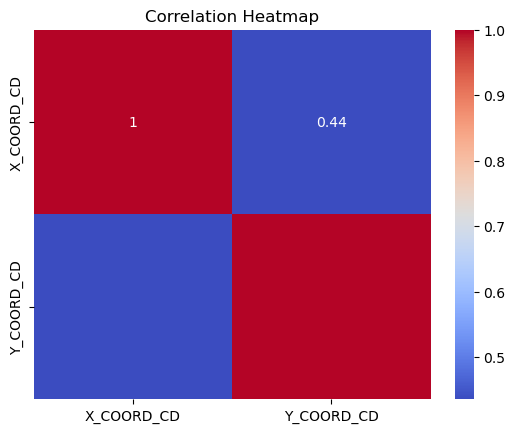

In [21]:
# Creating a heatmap to visualize the correlation between geographical features.
correlation_matrix = datasets['Drug_Crime'][['X_COORD_CD', 'Y_COORD_CD']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

### Plotting the Top 10 Address with Highest Crime using Bar Graph

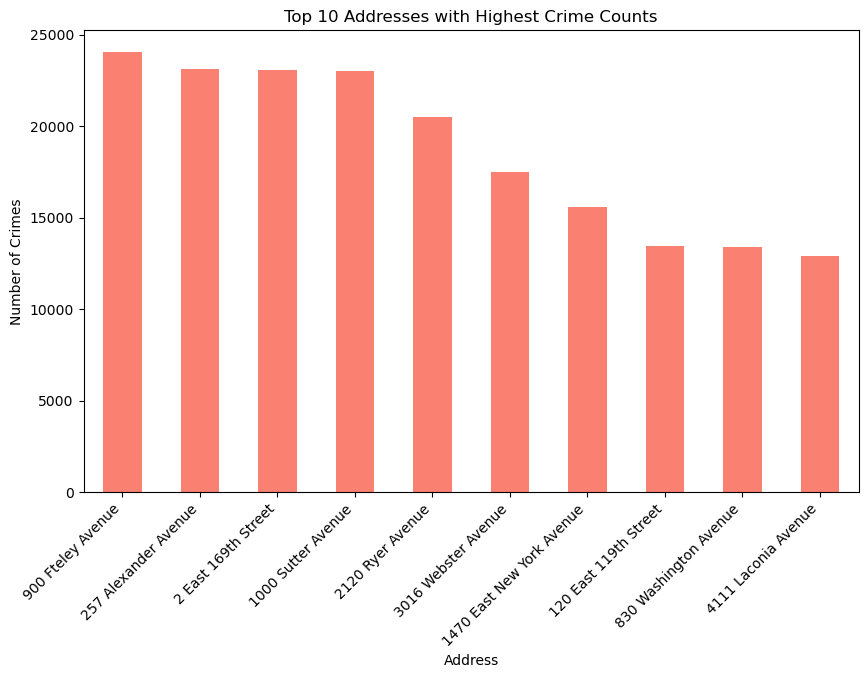

In [22]:
# Assuming 'Address' column exists
top_addresses = datasets['Drug_Crime']['Address'].value_counts().head(10)

# Plotting the top 10 addresses with the highest crime counts
plt.figure(figsize=(10, 6))
top_addresses.plot(kind='bar', color='salmon')
plt.title('Top 10 Addresses with Highest Crime Counts')
plt.xlabel('Address')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45, ha='right')
plt.show()

### Box Plot: Fluctuation of Crime Types Over the Last 16 Years

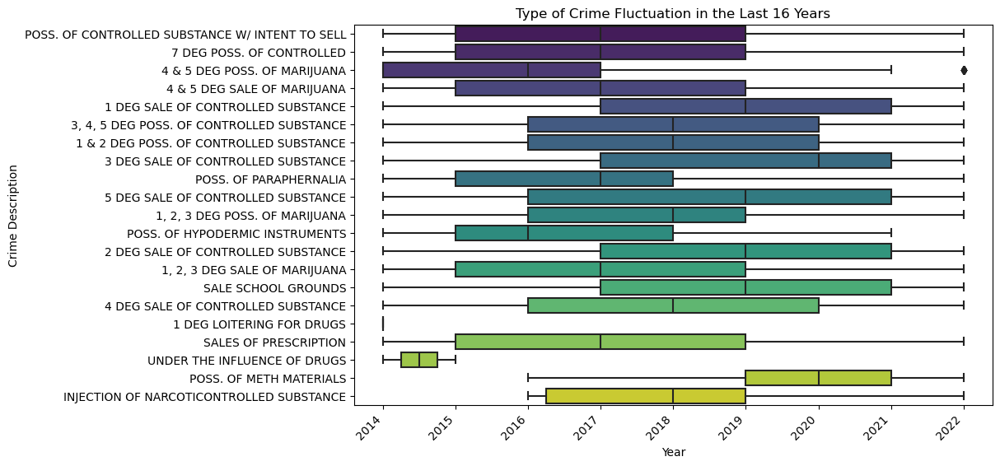

In [23]:
# Assuming 'PD_DESC' is the column containing crime information
crime_column = 'Crime'
last_16_years_data = datasets['Drug_Crime'][datasets['Drug_Crime']['Year'] >= (datasets['Drug_Crime']['Year'].max() - 16)]
last_8_years_data = datasets['Drug_Crime'][datasets['Drug_Crime']['Year'] >= (datasets['Drug_Crime']['Year'].max() - 8)]

# Create a box plot to show the distribution of crime over the last 16 years
plt.figure(figsize=(10, 6))
sns.boxplot(x='Year', y=crime_column, data=last_8_years_data, palette='viridis')
plt.title('Type of Crime Fluctuation in the Last 16 Years')
plt.xlabel('Year')
plt.ylabel('Crime Description')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.show()

### Folium Map: Visualization of Crime Incidents in New York City

In [24]:
# Create a map centered at a location (you can adjust this based on your data)
map_center = [40.7, -73.9]
crime_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each crime incident
for index, row in datasets['Drug_Crime'].head(100).iterrows():
    # Extract latitude and longitude
    lat_lon = row['Lat_Lon']
    latitude, longitude = lat_lon

    # Create a popup message with information about the crime
    popup_msg = f"Offense: {row['Crime']} \nLocation: {row['LOC_OF_OCCUR_DESC']} \nYear: {row['Year']}"

    # Add a marker to the map
    folium.Marker(
        location=[latitude, longitude],
        popup=popup_msg,
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(crime_map)

# Display crime_map
crime_map

### Folium Map: Heatmap of Crimes Throughout NYC By Precinct

In [25]:
crime_data = {}
drug_crime_snippet = datasets['Drug_Crime'].iloc[:2000]

# Iterate over the DataFrame rows and populate the dictionary
for index, row in drug_crime_snippet.iterrows():
    values = {
        'Police_Depart': row['NYC Penal Code'],
        'Coordinate': [row['Lat_Lon'][0],row['Lat_Lon'][1]]
    }
    crime_data[index] = values

PD_values = [value['Police_Depart'] for value in crime_data.values() ]
                        
# Displaying the extracted values
max_PD = max(PD_values)
min_PD = min(PD_values)

# Create a color scale for populationa
color = ['yellow','green' ,'orange', 'red','purple','brown']

color_scale_dot = folium.LinearColormap(colors=color, vmin=min_PD, vmax=max_PD)        

# Creating Shapely polygons for each district
district_polygons = {}

for feature in NYC_district['features']:
    boro_cd = feature['properties']['boro_cd']
    coordinates = feature['geometry']['coordinates'][0][0]
    
    polygon = Polygon(coordinates) 

    if boro_cd not in district_polygons:
        district_polygons[boro_cd] = MultiPolygon()           # Initialize MultiPolygon for each district
    district_polygons[boro_cd] = district_polygons[boro_cd].union(polygon)

crime_data_switch = {}

# Iterate over the DataFrame rows and populate the dictionary
for index, row in drug_crime_snippet.iterrows():
    values = {
        'Police_Depart': row['NYC Penal Code'],
        'Coordinate': [row['Lat_Lon'][1],row['Lat_Lon'][0]]
    }
    crime_data_switch[index] = values

# Initialize an empty dictionary to store the count of incidents per boro_cd
incident_num_dict = {}

# Iterate through crime incidents and check which district they belong to
for crime_id, crime_info in crime_data_switch.items():
    crime_coords = Point(crime_info['Coordinate'])
    
    for boro_cd, polygon in district_polygons.items():
        if polygon.contains(crime_coords):
            
            # Increment the count of incidents for this boro_cd
            if boro_cd in incident_num_dict:
                incident_num_dict[boro_cd] += 1
            else:
                incident_num_dict[boro_cd] = 1
            break

# Add districts with no incidents and set their count to 0
for boro_cd in district_polygons.keys():
    if boro_cd not in incident_num_dict:
        incident_num_dict[boro_cd] = 0

incident_num = [value for value in incident_num_dict.values() ]
                        
# Displaying the extracted values
max_num = max(incident_num)
min_num = min(incident_num)

# Create a color scale for population
color = ['yellow','green' ,'orange', 'red','purple','brown']

color_scale_incident = folium.LinearColormap(colors=color, vmin=min_num, vmax=max_num)

# Create a map centered at New York City
Map_NYC = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='CartoDB positron')

# Add GeoJSON layer to the map
folium.GeoJson(
    NYC_district,
    name='nyc-districts & crime number', 
    style_function= lambda feature: {    
        'fillColor': color_scale_incident(incident_num_dict.get(feature['properties']['boro_cd'])) ,   
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7
    },
                                    
).add_to(Map_NYC)

# Add a marker with text at a specific location
folium.map.Marker(location=[40.76440432106826, -74.02372202390437], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Manhattan</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.73536409760489, -73.85770225871684], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Queens</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.64209332024007, -74.00113449211089], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Brooklyn</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.60535622898584, -74.16354960167357], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Staten Island</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.857210423454255, -73.90217959092037], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Bronx</div>")).add_to(Map_NYC)

# Add legend for population color scale
color_scale_incident.caption = 'Crime Category' 
color_scale_incident.add_to(Map_NYC)

Map_NYC

# Census Visualizations (ONLY)

### Normalized Radar Plot of Density of Race in NYC and Each Individual Borough in 2010 and 2020

In [26]:
# Build radar plot for each Borough
for borough in ['New York City', 'Manhattan', 'Bronx', 'Brooklyn', 'Queens', 'Staten Island']:
    fig_boro = go.Figure()

    # Add 2010 to Radar Plot
    fig_boro.add_trace(go.Scatterpolar(
                r=filtered_race_10_rnorm.loc[borough][:],
                theta=list(filtered_race_10_rnorm.columns),
                fill='toself',
                name='2010',
                showlegend=True,
                fillcolor='rgba(255, 87, 51, 0.75)',
                line={'color': 'rgba(255, 87, 51, 0.2)'}))
    
    # Add 2020 to Radar Plot
    fig_boro.add_trace(go.Scatterpolar(
                r=filtered_race_20_rnorm.loc[borough][:],
                theta=list(filtered_race_20_rnorm.columns),
                fill='toself',
                name='2020', 
                showlegend=True,
                fillcolor='rgba(207, 159, 255, 0.5)',
                line={'color': 'rgba(207, 159, 255, 0.5)'}))
    
    # Update axis
    fig_boro.update_layout(
        title_text=f'Pop. Density by Race (Euclidean Normalized) - {borough}',
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[0, 1]
        ))
    )
    
    # Show Plot
    fig_boro.show()

### Group Bar Chart of Total Population in Each Borough in 2010 and 2020

In [27]:
fig_pop = go.Figure()

boroughs = ['Manhattan', 'Bronx', 'Brooklyn', 'Queens', 'Staten Island']

# Get population of each borough in 2010 and 2020 in an array in the same order as the boroughs list
y1 = [filtered_all_10.loc[boro][0] for boro in boroughs]
y2 = [filtered_all_20.loc[boro][0] for boro in boroughs]

# Add 2010 then 2020 to Bar plot
fig_pop.add_trace(go.Bar(
        x=boroughs,
        y=y1,
        name='2010',
        marker_color='indianred',
        text=y1,
        textposition='auto',
))
fig_pop.add_trace(go.Bar(
        x=boroughs,
        y=y2,
        name='2020',
        marker_color='lightsalmon',
        text=y2,
        textposition='auto',
))

# Show in Bar Plot
fig_pop.update_layout(barmode='group', title_text='Total Population per Borough Between 2010 and 2020')
fig_pop.show()

### Stacked Bar Chart of Total Population Change

In [28]:
# Obtain difference between 2010 and 2020 in population changes
diff_natural = pd.DataFrame(du.filter_by_boro_feature(total_census, feature='Natural Change')['All'])
diff_migration = pd.DataFrame(du.filter_by_boro_feature(total_census, feature='Net Migration')['All'])

fig_diff = go.Figure()

# Get population change of each borough in 2010 and 2020 in an array in the same order as the boroughs list
y1 = [diff_natural.loc[boro][0] for boro in boroughs]
y2 = [diff_migration.loc[boro][0] for boro in boroughs]

# Add 2010 then 2020 to stacked Bar plot
fig_diff.add_trace(go.Bar(
        name='Natural Change',
        x=boroughs,
        y=y1,
        text=y1,
        textposition='auto',
))
fig_diff.add_trace(go.Bar(
        name='Net Migration', 
        x=boroughs, 
        y=y2,
        text=y2,
        textposition='auto',
))

# Change the bar mode to have negative change under 0
fig_diff.update_layout(barmode='relative', title_text='Population Change per Borough between 2010 and 2020')
fig_diff.show()

# Population Visualizations (Focus on 2020)

### Pie Chart of Total Population Per Borough in 2020

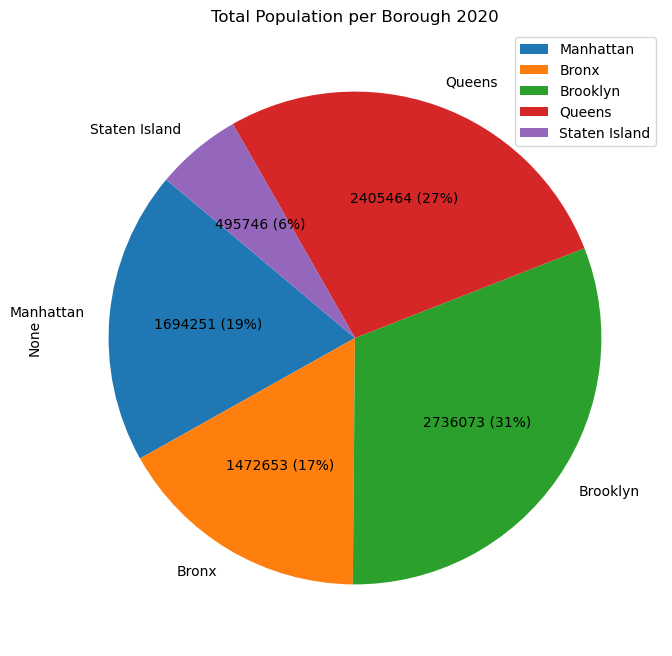

In [29]:
total_population = filtered_all_20.iloc[1:]['All'].to_dict()

#Turn into Pandas Series
s = pd.Series(total_population)

def absolute_value(val):
    a  = int(val/100.*s.sum())
    return f'{a} ({val:.0f}%)'

# Plot pie chart
plt.figure(figsize=(8, 8),facecolor='white')
s.plot(kind='pie', autopct=absolute_value, startangle=140)
plt.title('Total Population per Borough 2020')
plt.legend()
plt.show()

### Folium Map: Total Population per Precinct

In [30]:
# Convert population data to a dictionary
population_data = dict(zip(population_df['GeoID'], population_df['Total Population']))

max_population = max(population_data.values())
min_population = min(population_data.values())

# Create a color scale for population
color = ['gray','green', 'yellow','orange', 'red','purple','brown']

color_scale = folium.LinearColormap(colors=color, vmin=min_population, vmax=max_population)

# Create a map centered at New York City
Map_NYC = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='CartoDB positron')

# Add GeoJSON layer to the map
folium.GeoJson(
    NYC_district,
    name='nyc-districts & population',

    style_function= lambda feature: {
        'fillColor': color_scale(population_data.get(int(feature['properties']['boro_cd']),0)),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7
    },
                             
).add_to(Map_NYC)

manhattan_geojson = NYC_borough['features'][3]
bronx_geojson = NYC_borough['features'][1]   
brooklyn_geojson = NYC_borough['features'][4]
queens_geojson = NYC_borough['features'][2]  
staten_island_geojson = NYC_borough['features'][0]

# Add a marker with text at a specific location
folium.map.Marker(location=[40.76440432106826, -74.02372202390437], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Manhattan</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.73536409760489, -73.85770225871684], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Queens</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.64209332024007, -74.00113449211089], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Brooklyn</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.60535622898584, -74.16354960167357], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Staten Island</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.857210423454255, -73.90217959092037], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Bronx</div>")).add_to(Map_NYC)

# Add legend for population color scale
color_scale.caption = 'Population' 
color_scale.add_to(Map_NYC)

# Display the map
Map_NYC

### Racial Composition of NYC in 2020 (Non-Census)

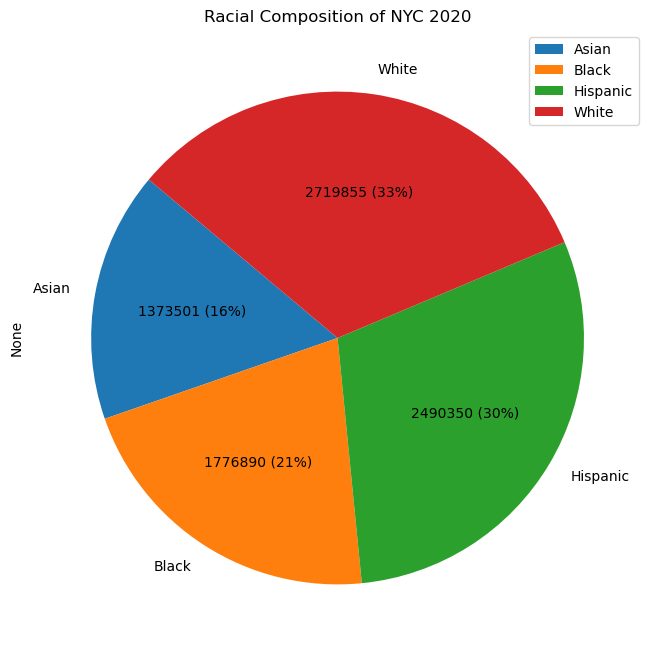

In [31]:
race_total_population = {col: sum(filtered_race_20.iloc[1:][col]) for col in filtered_race_20.columns}

#Turn into Pandas Series
s = pd.Series(race_total_population)

def absolute_value(val):
    a  = int(val/100.*s.sum())
    return f'{a} ({val:.0f}%)'

# Plot pie chart
plt.figure(figsize=(8, 8),facecolor='white')
s.plot(kind='pie', autopct=absolute_value, startangle=140)
plt.title('Racial Composition of NYC 2020')
plt.legend()
plt.show()

### Box Plot of House Prices of Each Borough

Max: 5000000
Min: 1000
Mean: 539407
Lower Quantile (25th percentile): 250000.0
Upper Quantile (75th percentile): 680000.0


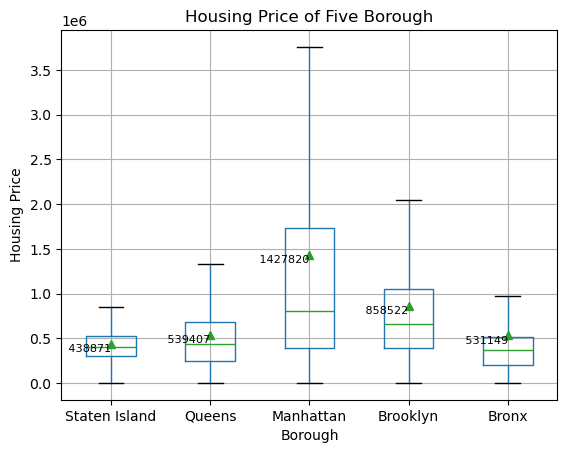

In [32]:
# Convert population data to a dictionary
price_df_queens = house_df_queens['SALE PRICE\n'].tolist()
# Remove all occurrences of 0 from the list, and delete too-small values
price_df_queens = [val for val in price_df_queens if 1000 <= val <= 5000000]

# Convert population data to a dictionary
price_df_statenisland = house_df_statenisland['SALE PRICE\n'].tolist()
# Remove all occurrences of 0 from the list, and delete too-small values
price_df_statenisland = [val for val in price_df_statenisland if 1000 <= val <= 5000000]

# Convert population data to a dictionary
price_df_manhattan = house_df_manhattan['SALE PRICE\n'].tolist()
# Remove all occurrences of 0 from the list, and delete too-small values
price_df_manhattan = [val for val in price_df_manhattan if 1000 <= val <= 10000000]

# Convert population data to a dictionary
price_df_brooklyn = house_df_brooklyn['SALE PRICE\n'].tolist()
# Remove all occurrences of 0 from the list, and delete too-small values
price_df_brooklyn = [val for val in price_df_brooklyn if 1000 <= val <= 5000000]


# Convert population data to a dictionary
price_df_bronx = house_df_bronx['SALE PRICE\n'].tolist()
# Remove all occurrences of 0 from the list, and delete too-small values
price_df_bronx = [val for val in price_df_bronx if 1000 <= val <= 6000000]

# Find max, min, mean, upper/lower quantile of housing price
max_queens = max(price_df_queens)
min_queens = min(price_df_queens)
mean_queens = int(statistics.mean(price_df_queens))
lower_quantile_queens = statistics.quantiles(price_df_queens, n=4)[0] # 25th percentile
upper_quantile_queens = statistics.quantiles(price_df_queens, n=4)[2]  # 75th percentile
print("Max:", max_queens)
print("Min:", min_queens)
print("Mean:", mean_queens)
print("Lower Quantile (25th percentile):", lower_quantile_queens)
print("Upper Quantile (75th percentile):", upper_quantile_queens)

data = {
    'Staten Island': price_df_statenisland,
    'Queens': price_df_queens,
    'Manhattan': price_df_manhattan,
    'Brooklyn': price_df_brooklyn,
    'Bronx': price_df_bronx
}

# Find the maximum length among the columns and Pad the shorter columns with NaN
max_length = max(len(values) for values in data.values())

for key, values in data.items():
    data[key] = values + [np.nan] * (max_length - len(values))

df = pd.DataFrame(data)

# Create a boxplot using Pandas
boxplot = df.boxplot(showmeans=True, showfliers=False, grid=True, column=['Staten Island', 'Queens','Manhattan','Brooklyn','Bronx'])

# Calculate means for each category
means = df.mean()

# Annotate the boxplot with mean values (display only the integer part of the mean)
for i, col in enumerate(df.columns):
    mean_int = int(means[col])  # Get the integer part of the mean
    plt.text(i + 1, means[col], f' {mean_int}', ha='right', va='top', color='black', fontsize = 8)

# Add labels
plt.xlabel('Borough')
plt.ylabel('Housing Price')
plt.title('Housing Price of Five Borough')

plt.show()

In [33]:
race_population = {}

# Iterate over the DataFrame rows and populate the dictionary
for index, row in population_df.iterrows():
    key = row['GeoID']
    values = {
        'Hispanic/Latino ': row['Hispanic/Latino (of any race)'],
        'White': row['White non-Hispanic'],
        'Black': row['Black non-Hispanic'],
        'Asian': row['Asian non-Hispanic'],
        'Some other race': row['Some other race, non-Hispanic']
    }
    race_population[key] = values
    
for Geo_ID, race_data in race_population.items():
    race_labels = list(race_data.keys())
    race_values = list(race_data.values())
    plt.figure(figsize=(10, 10))
    
    if sum(race_values) > 0:
        plt.pie(race_values)
    else:
        plt.pie([1], colors=['#c1c1c1'])
    
    plt.title(f"Race Population in District {Geo_ID}")
    plt.savefig(f"data/Race Pie Chart/district_{Geo_ID}_pie_chart.png", transparent=True)               # Save each pie chart as an image
    
    plt.close()

### Racial Composition (via Pie Chart) of Each Precinct in Manhattan


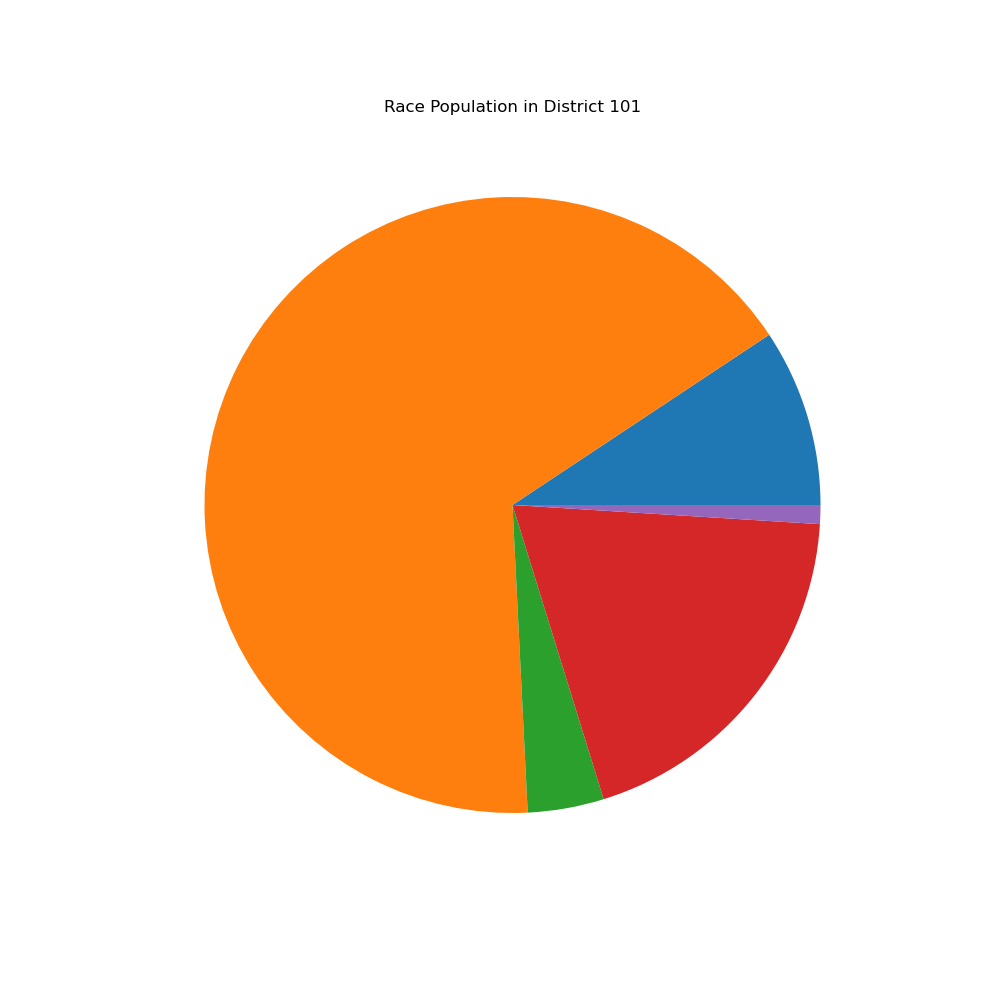
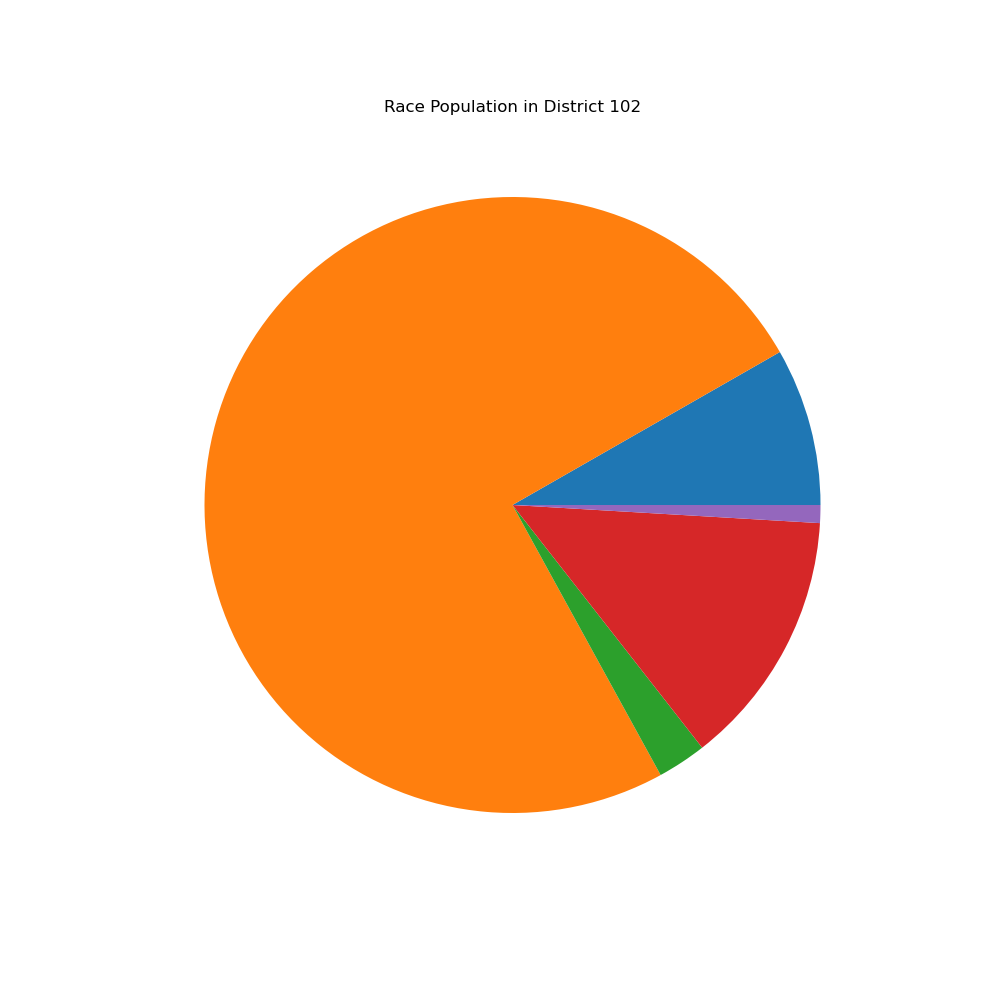
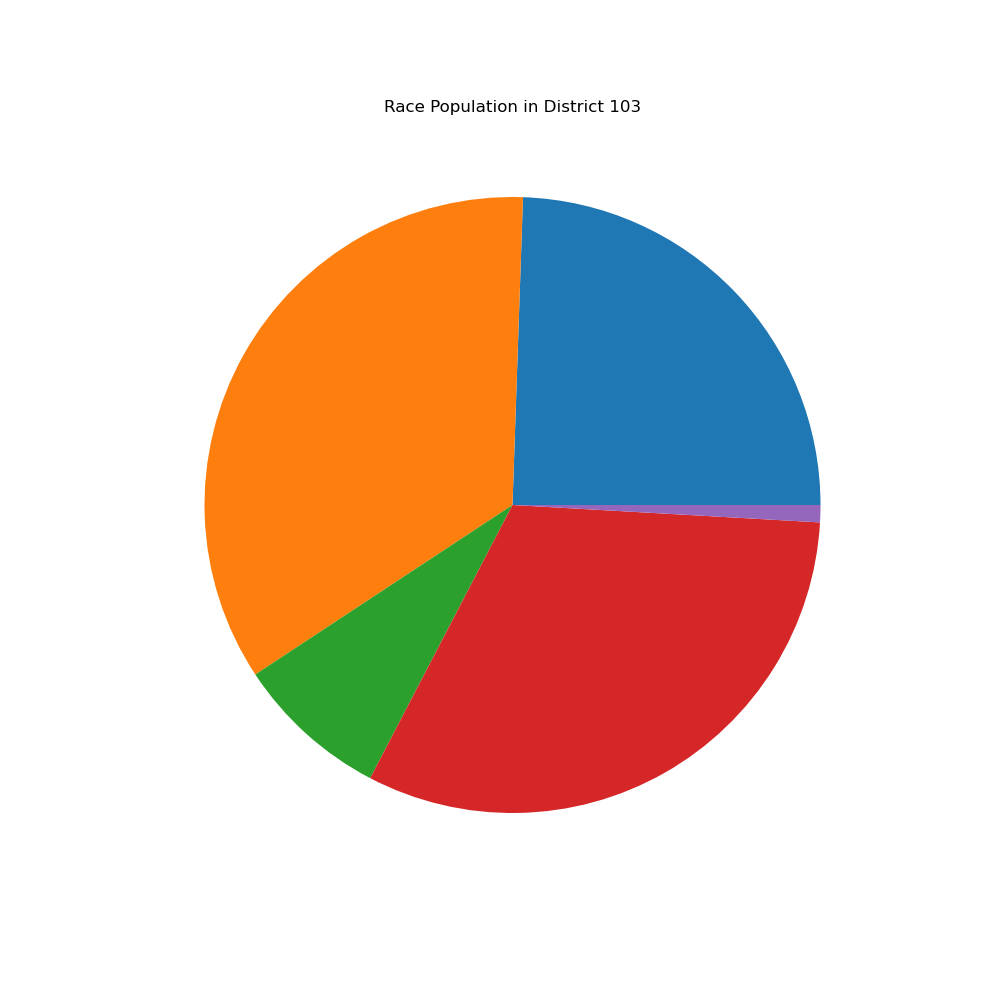
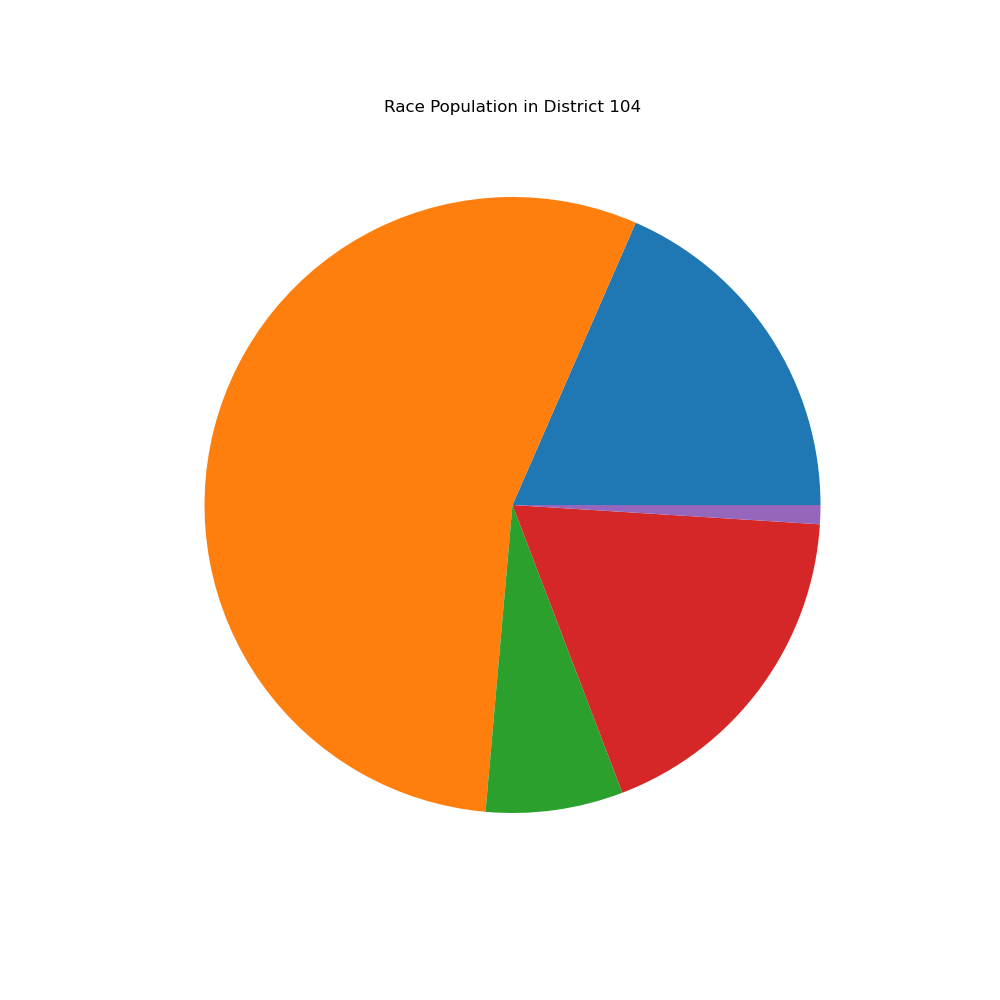
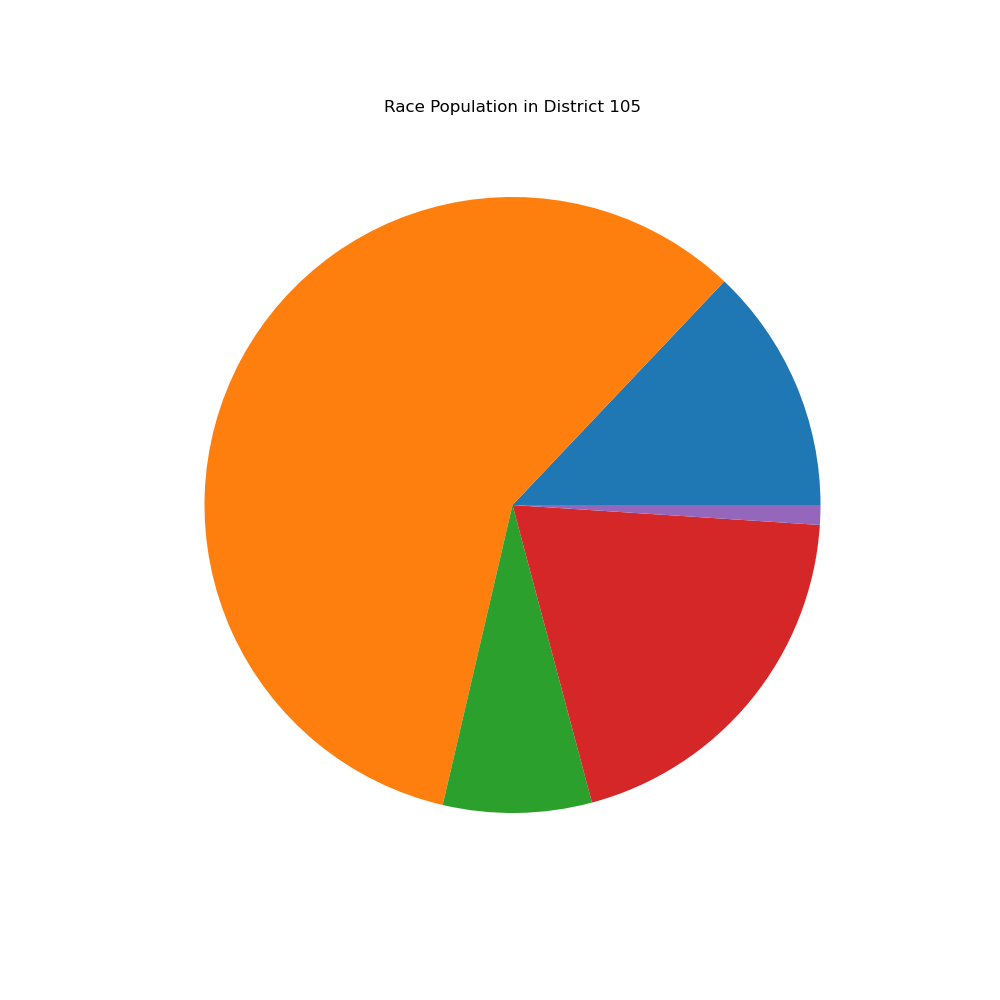
...
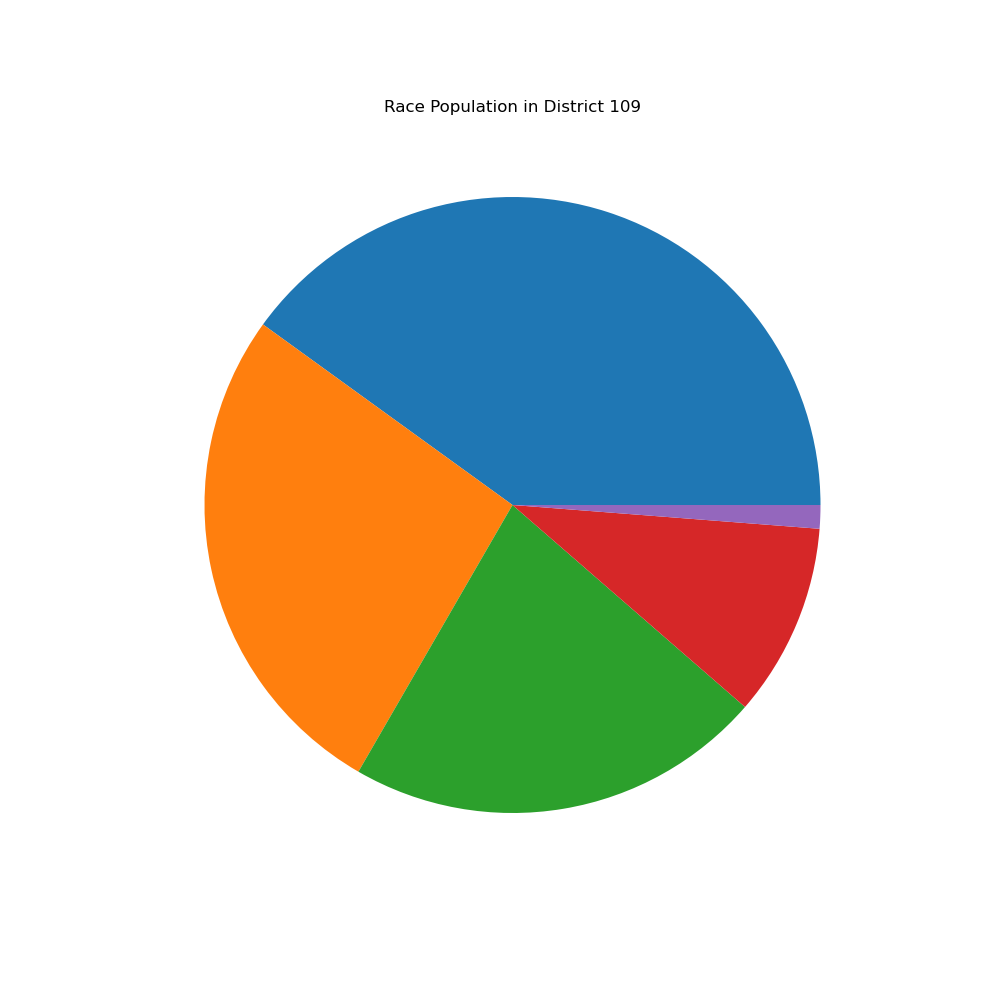
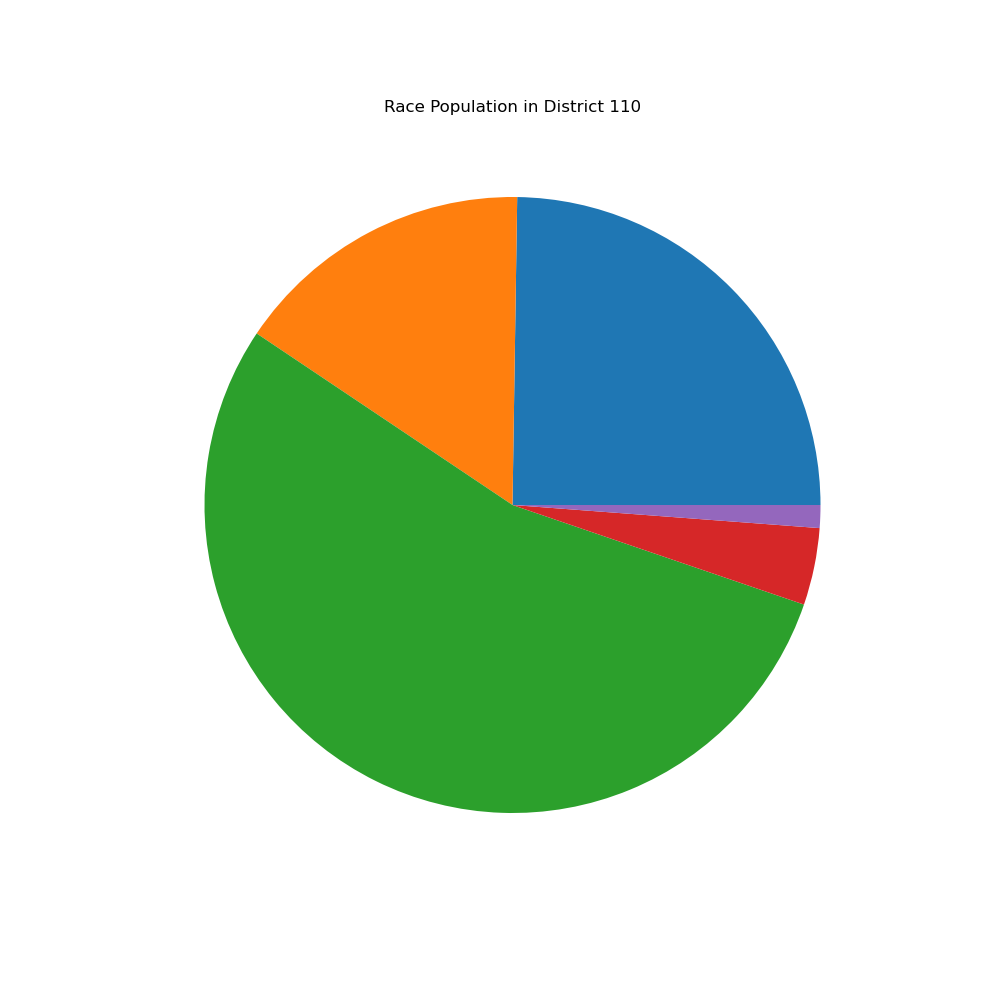
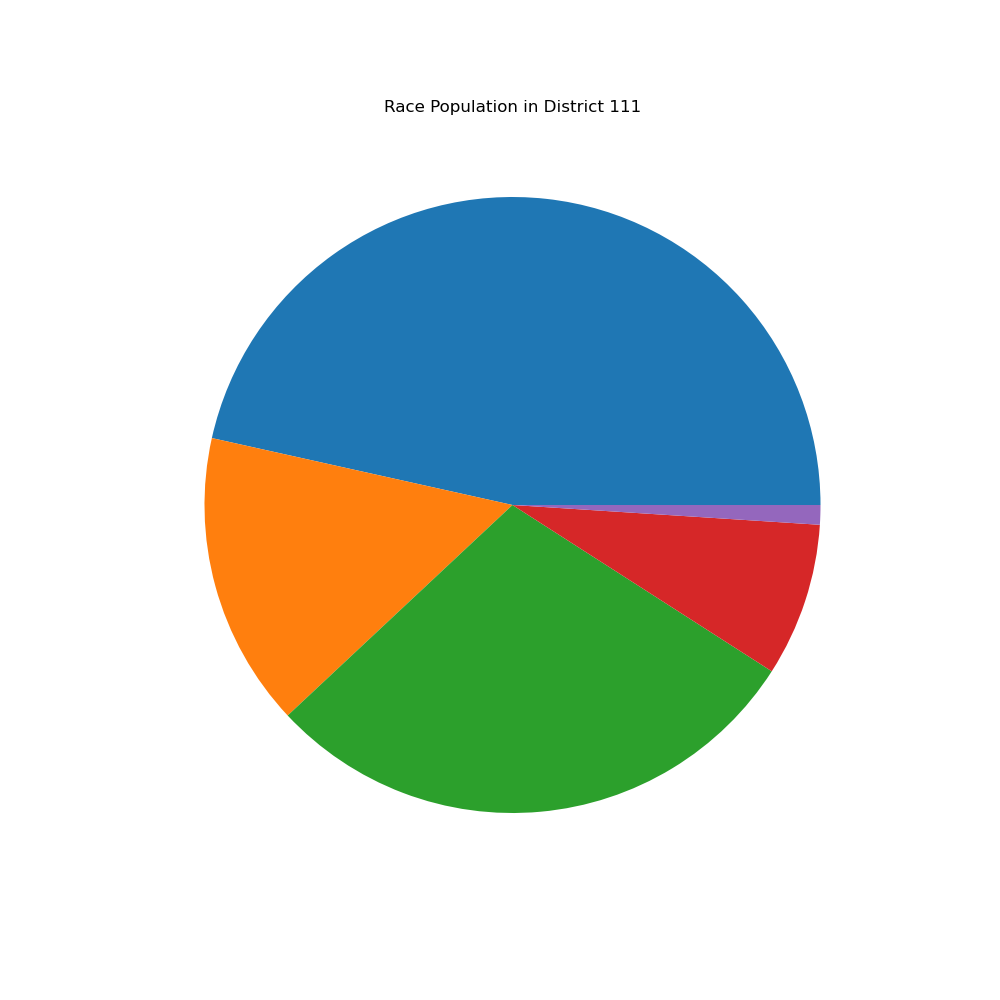
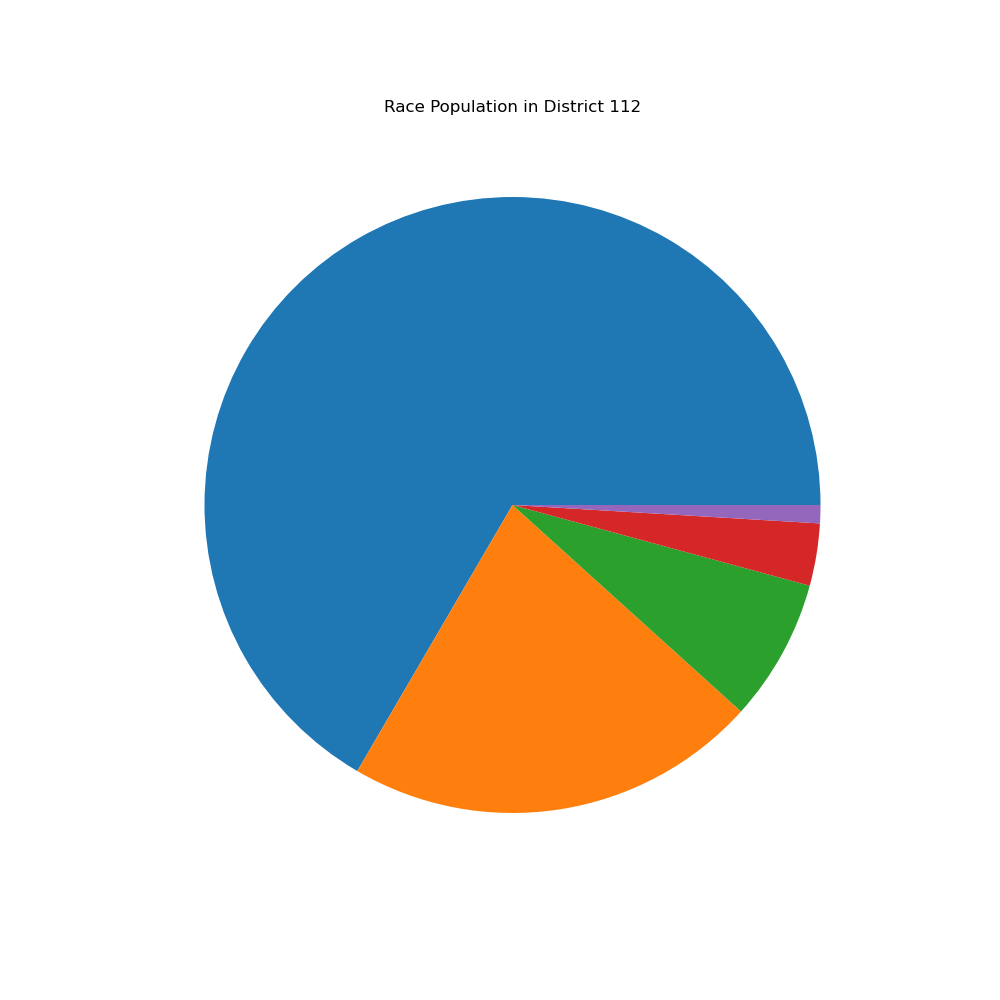
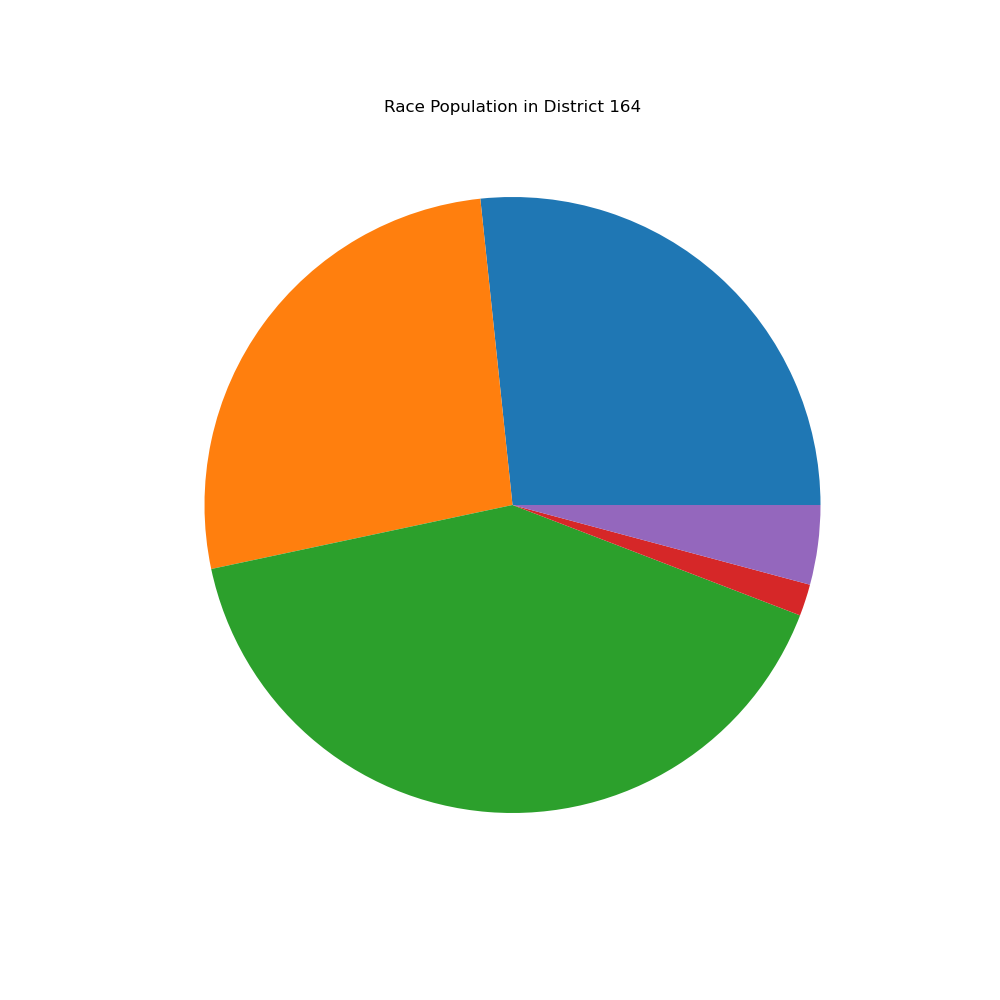

In [34]:
# Create an empty dictionary to store Manhattan districts
borough_manhattan_district = {'type': 'FeatureCollection', 'features': []}

# Loop through the original districts
for district in NYC_district['features']:
    boro_cd = district['properties']['boro_cd']
    
    # Check if the boro_cd starts with '1' 
    if boro_cd.startswith('1'):
        # Append the district to the new dictionary
        borough_manhattan_district['features'].append(district)
        
# Create an dictionary to store the coordinate
coordinate_dict_manhattan = {}

for Geo_ID in race_population.keys():

    # Find corresponding district geo-center coordinates
    target_coordinates = None
    
    for feature in borough_manhattan_district['features']:
        if int(feature['properties']['boro_cd'] ) == Geo_ID:
            target_coordinates = feature['geometry']['coordinates'][0][0]

            # Calculate average latitude and longitude
            total_lat, total_lon = 0, 0
            num_points = len(target_coordinates)

            for lat, lon in target_coordinates:
                total_lat += lat
                total_lon += lon

            avg_lat = total_lat / num_points
            avg_lon = total_lon / num_points

            coordinate_dict_manhattan[Geo_ID] = [avg_lon,avg_lat]

            break

coordinate_dict_manhattan[101] = [40.70480236831942, -74.01259408930167]
coordinate_dict_manhattan[112] = [40.84449075504857, -73.93866070727968]

# Create a map centered at New York City
Map_NYC = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='CartoDB positron')

#Add GeoJSON layer to the map
folium.GeoJson(
    borough_manhattan_district,
    name='Manhattan & race population',

    style_function= lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7
    }                                  
).add_to(Map_NYC)

for Geo_ID in coordinate_dict_manhattan.keys():
   
    image_path = f'data/Race Pie Chart/district_{Geo_ID}_pie_chart.png'

    # Add the PNG image as a marker to the map
    icon = folium.CustomIcon(
    icon_image=image_path,
    icon_size=(55, 55)  # Adjust the size of the icon as needed
    )

    marker = folium.Marker(location=coordinate_dict_manhattan.get(Geo_ID), icon=icon)
    marker.add_to(Map_NYC)

folium.map.Marker(location=[40.76440432106826, -74.02372202390437], icon=folium.DivIcon(html=f"<div style='font-size: 15pt'>Manhattan</div>")).add_to(Map_NYC)

# Display the map
Map_NYC

### Racial Composition (via Pie Chart) of Each Precinct in Bronx


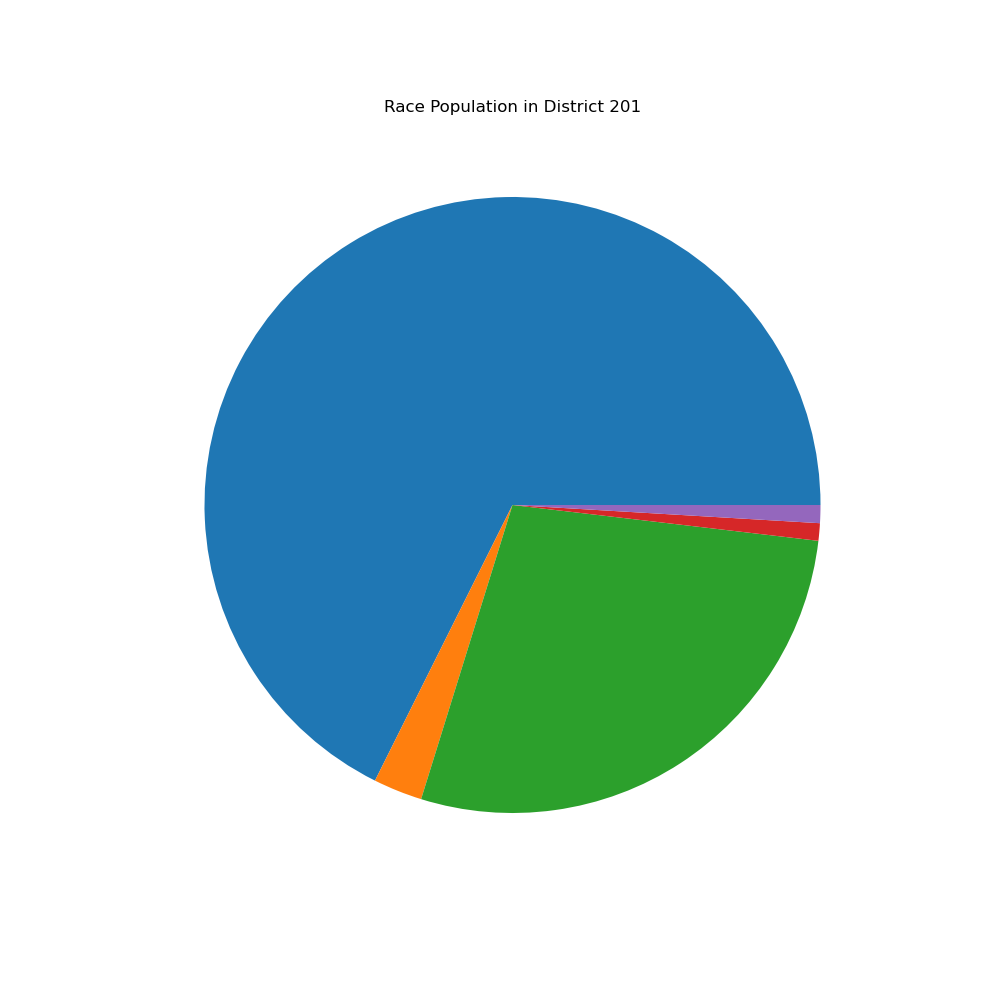
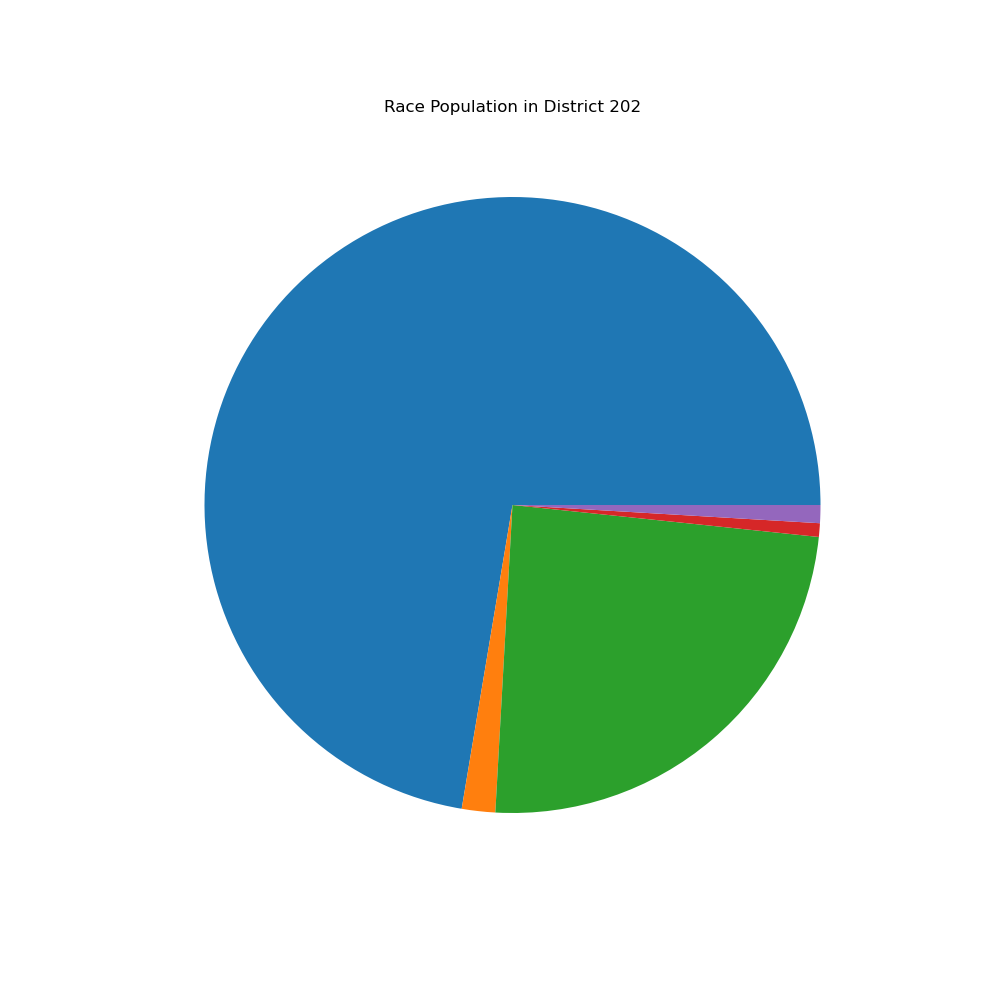
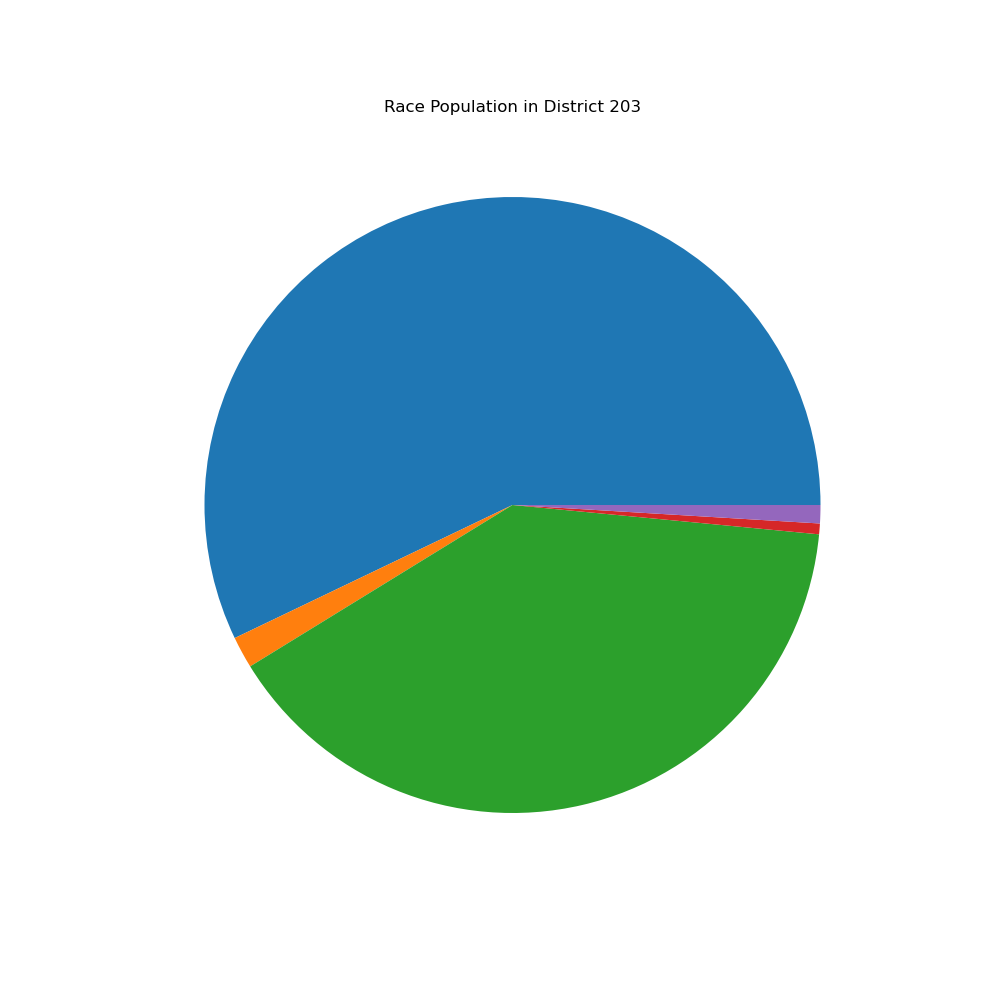
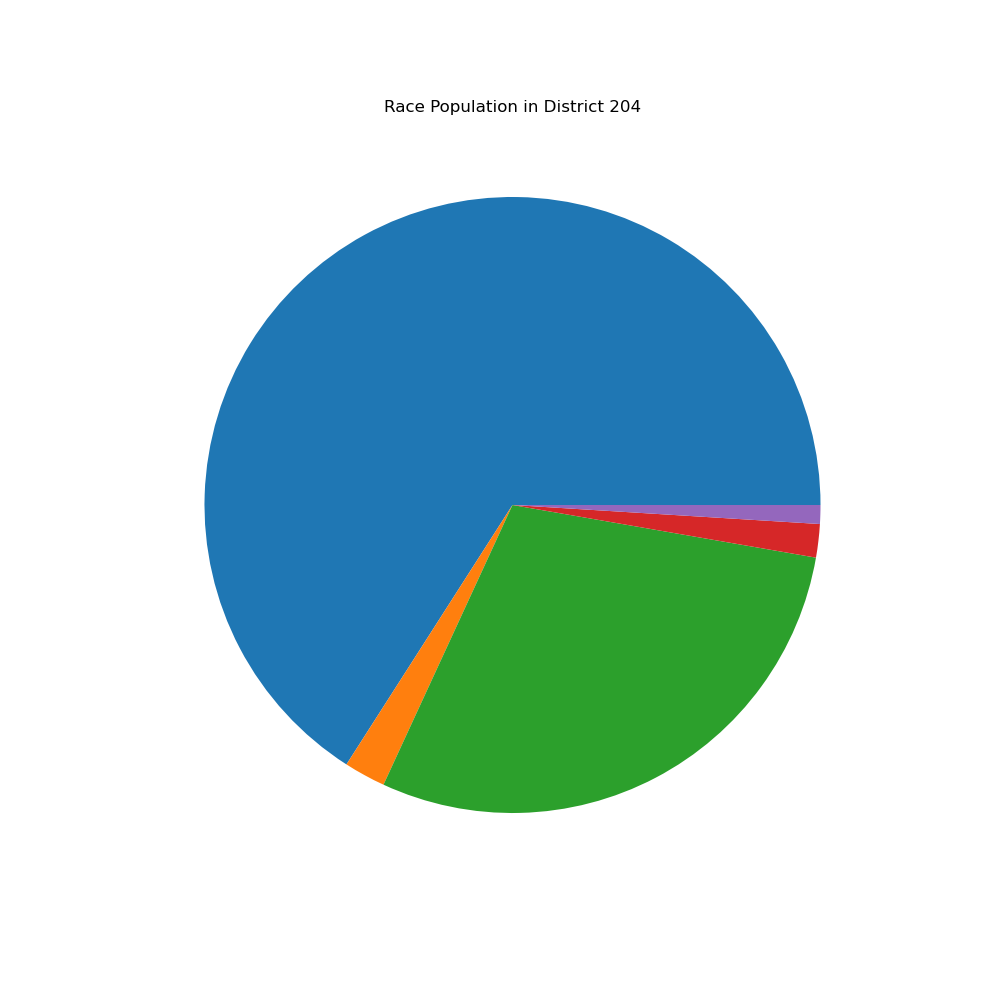
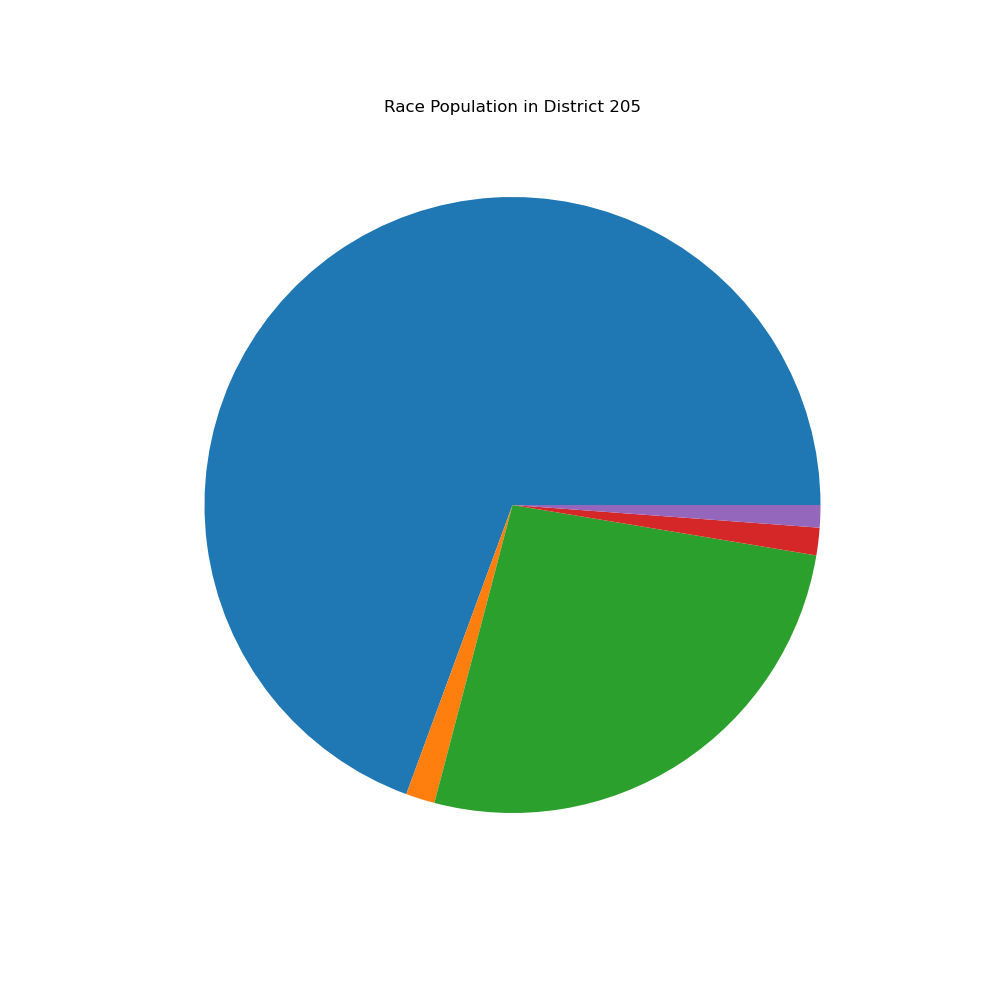
...
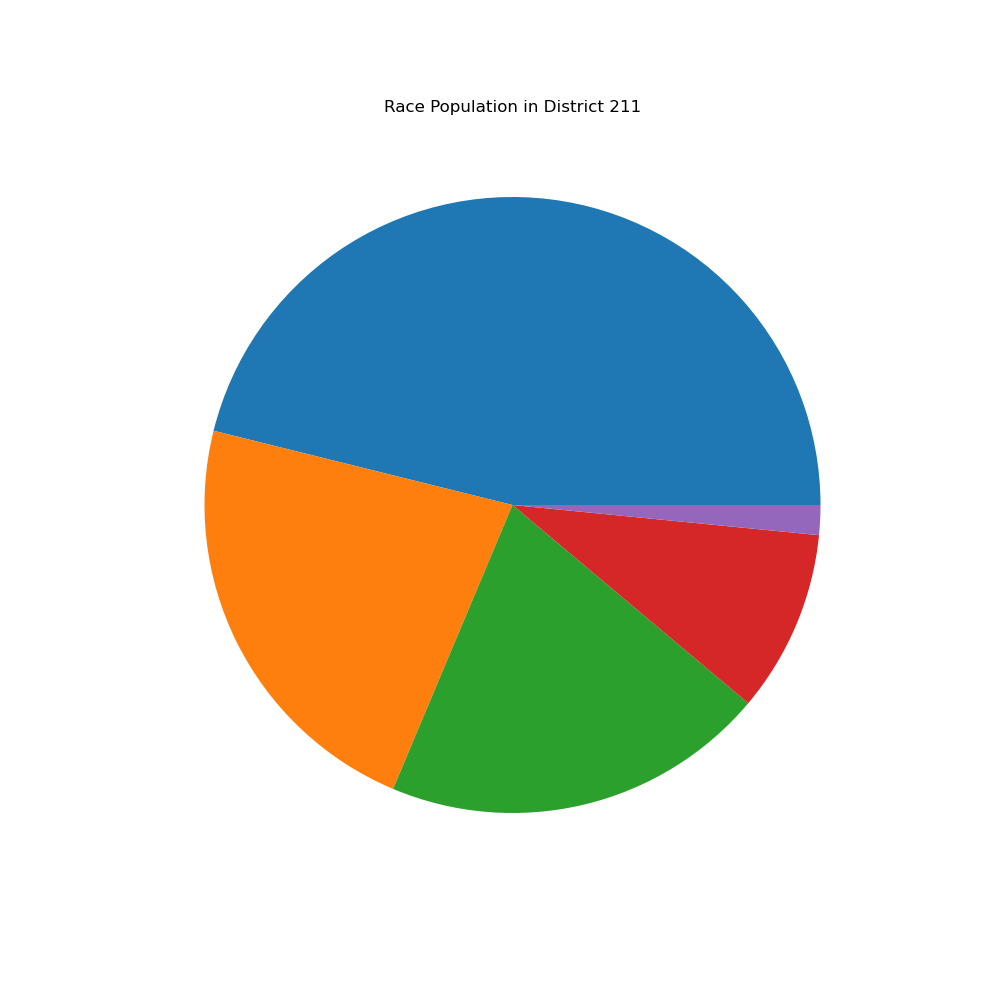
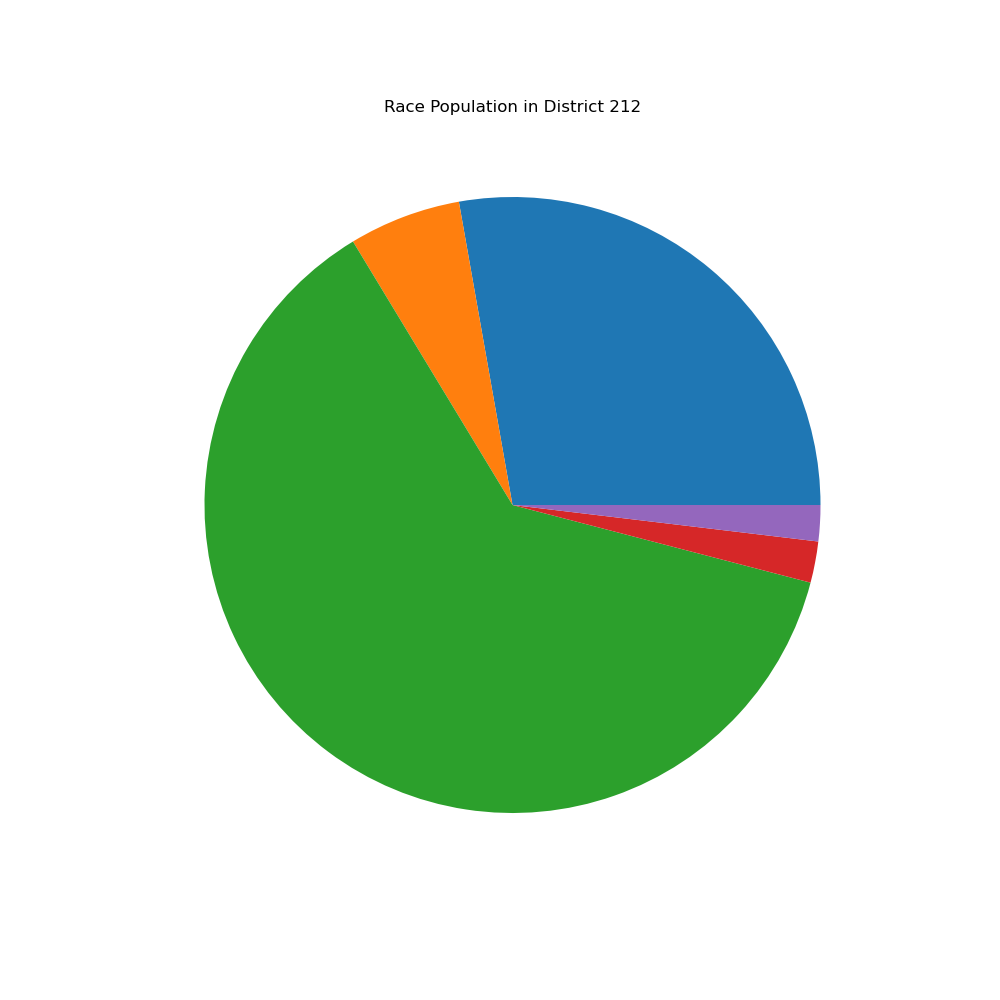
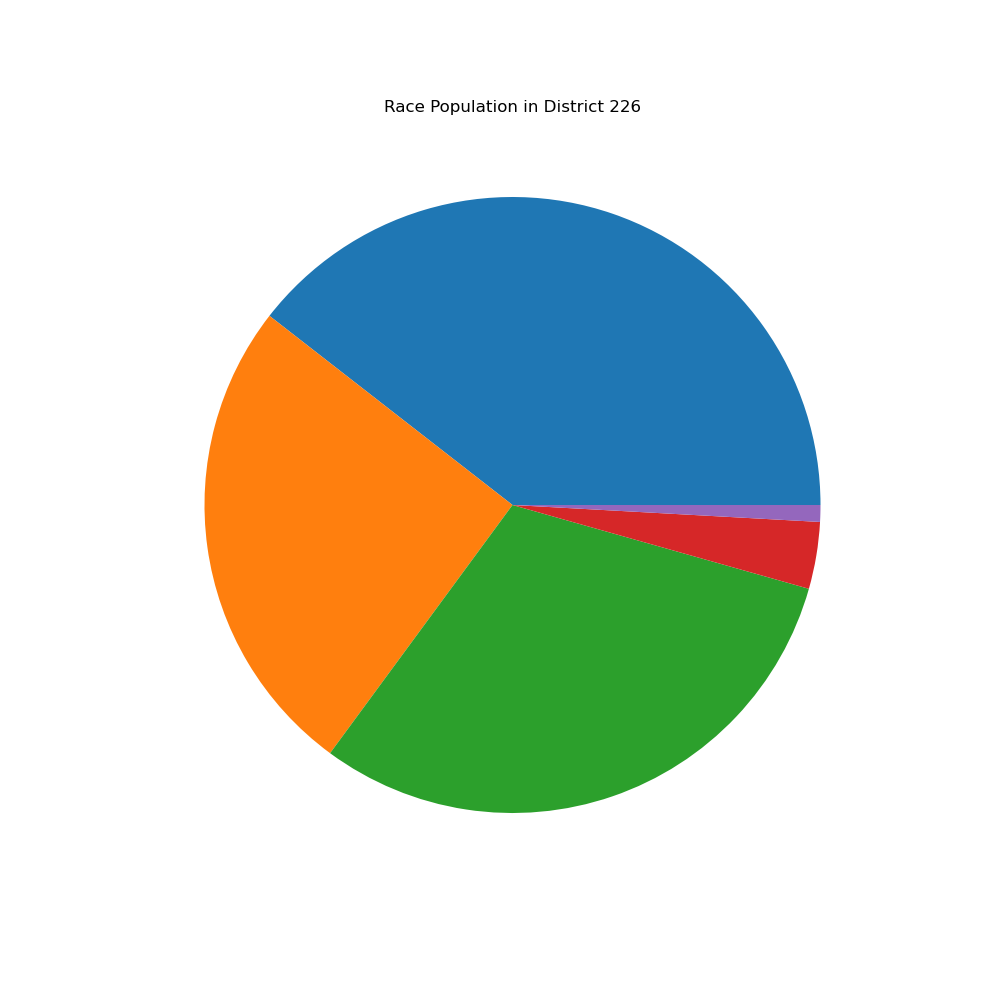
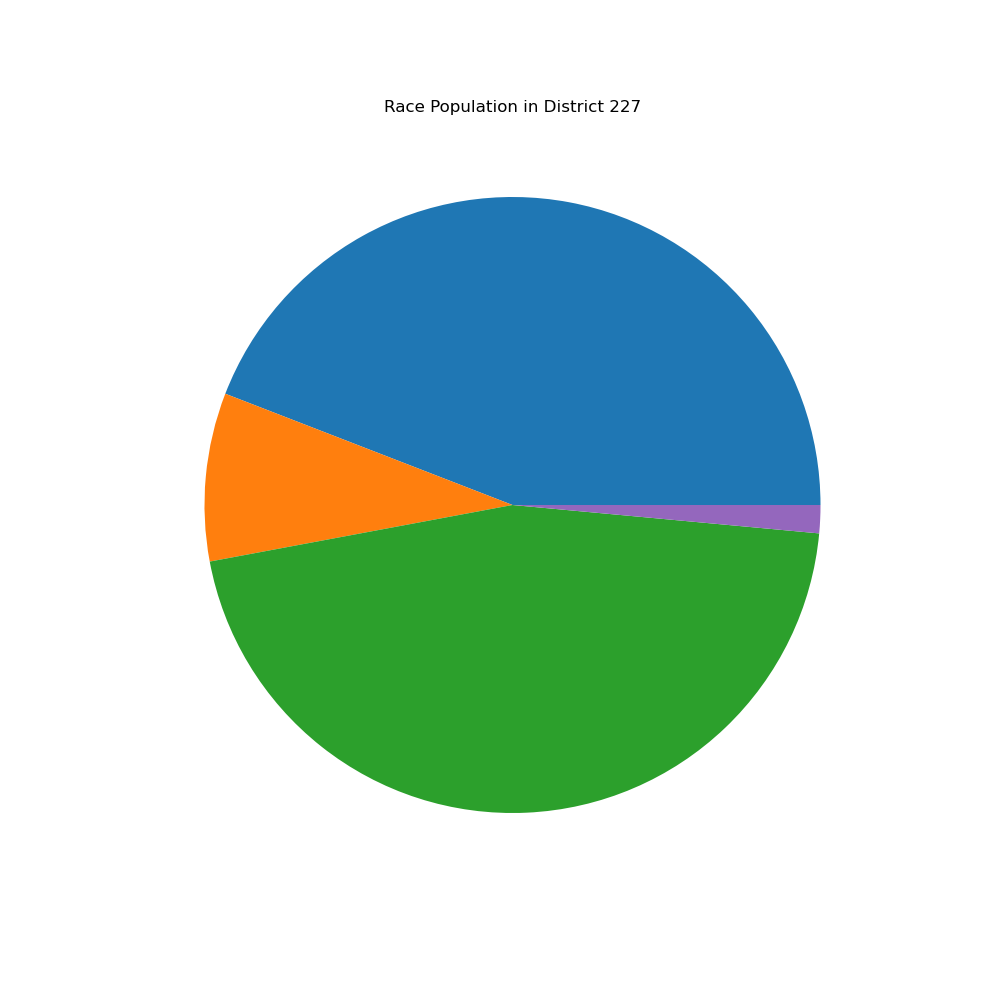
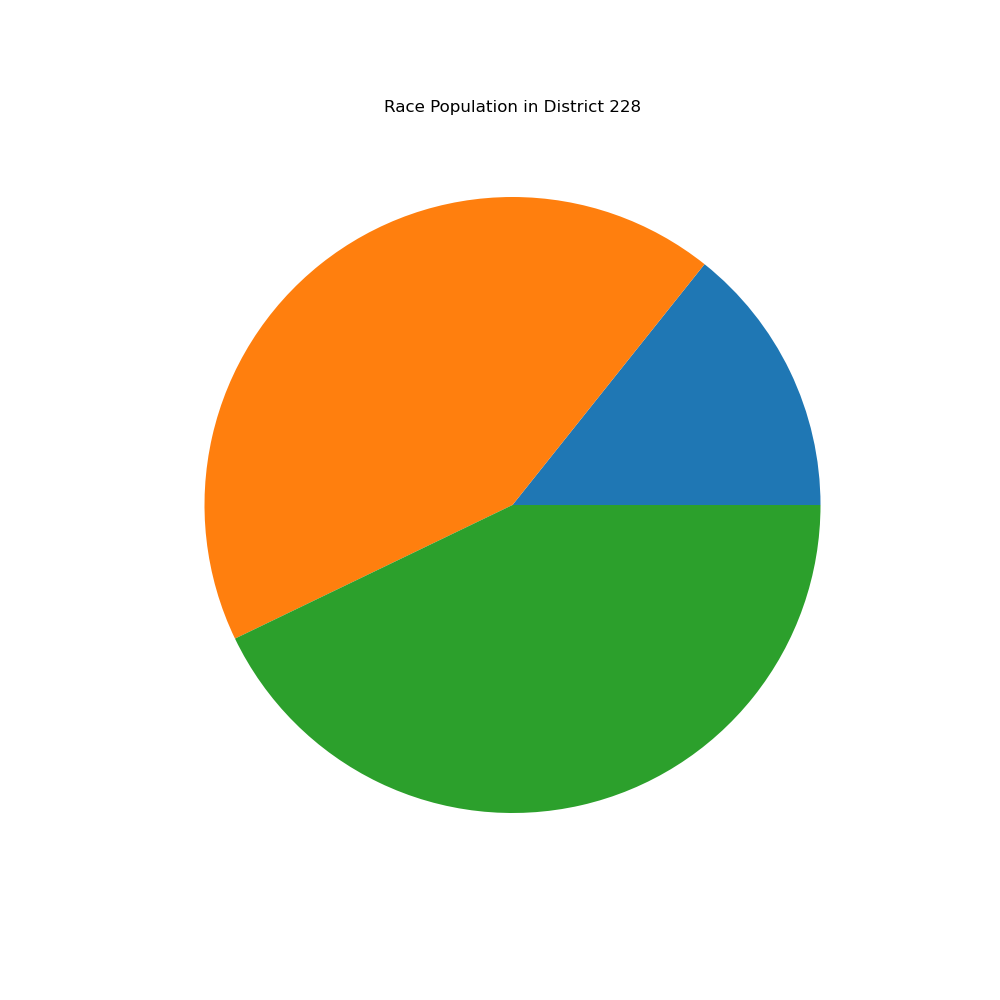

In [35]:
borough_bronx_district = {'type': 'FeatureCollection', 'features': []}

# Loop through the original districts
for district in NYC_district['features']:
    boro_cd = district['properties']['boro_cd']
    
    # Check if the boro_cd starts with '1' 
    if boro_cd.startswith('2'):
        # Append the district to the new dictionary
        borough_bronx_district['features'].append(district)

# Create an dictionary to store the coordinate
coordinate_dict_bronx = {}

for Geo_ID in race_population.keys():

    # Find corresponding district geo-center coordinates
    target_coordinates = None
    
    for feature in borough_bronx_district['features']:
        if int(feature['properties']['boro_cd'] ) == Geo_ID:
            target_coordinates = feature['geometry']['coordinates'][0][0]

            # Calculate average latitude and longitude
            total_lat, total_lon = 0, 0
            num_points = len(target_coordinates)

            for lat, lon in target_coordinates:
                total_lat += lat
                total_lon += lon

            avg_lat = total_lat / num_points
            avg_lon = total_lon / num_points

            coordinate_dict_bronx[Geo_ID] = [avg_lon,avg_lat]

            break

# Create a map centered at New York City
Map_NYC = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='CartoDB positron')

#Add GeoJSON layer to the map
folium.GeoJson(
    borough_bronx_district,
    name='Bronx & race population',

    style_function= lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7
    }                                  
).add_to(Map_NYC)

for Geo_ID in coordinate_dict_bronx.keys():
   
    image_path = f'data/Race Pie Chart/district_{Geo_ID}_pie_chart.png'

    # Add the PNG image as a marker to the map
    icon = folium.CustomIcon(
    icon_image=image_path,
    icon_size=(70, 70)  # Adjust the size of the icon as needed
    )

    marker = folium.Marker(location=coordinate_dict_bronx.get(Geo_ID), icon=icon)
    marker.add_to(Map_NYC)

folium.map.Marker(location=[40.83339766660129, -73.85800563116976], icon=folium.DivIcon(html=f"<div style='font-size: 22pt'>Bronx</div>")).add_to(Map_NYC)

# Display the map
Map_NYC

### Racial Composition (via Pie Chart) of Each Precinct in Brooklyn


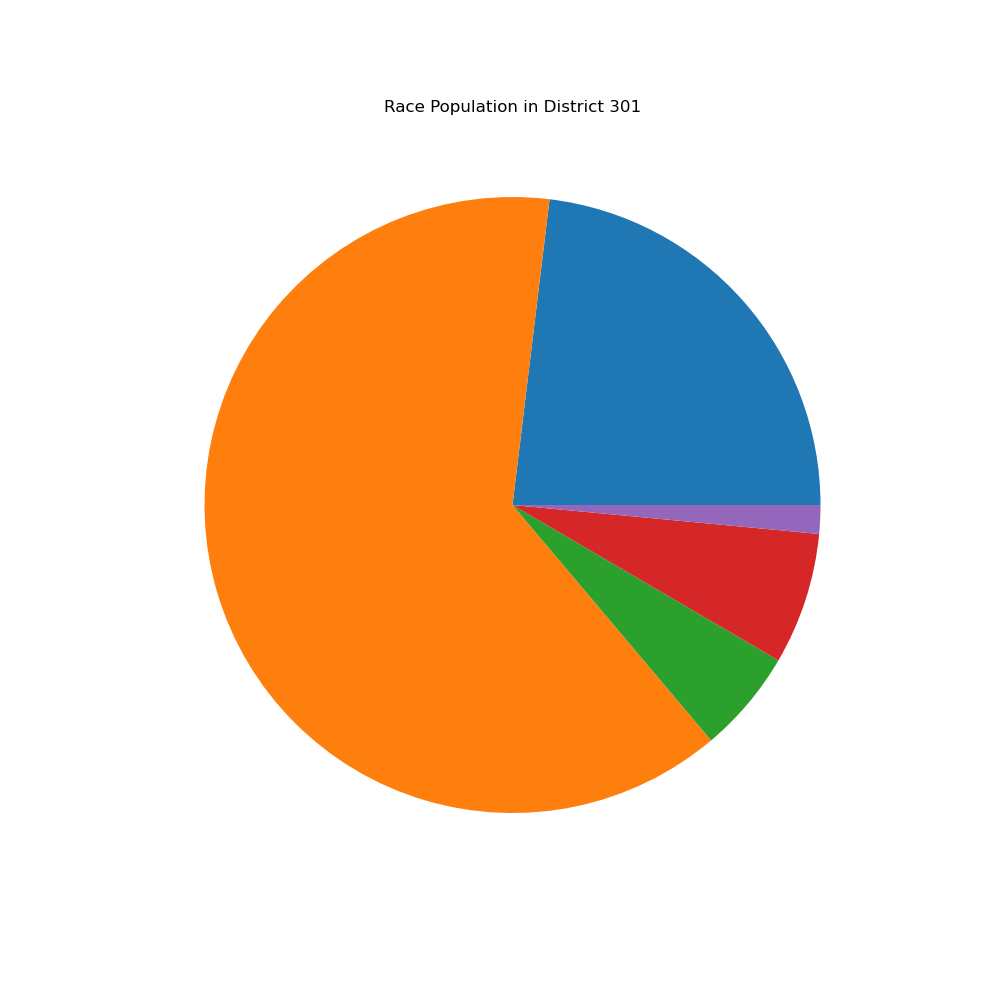
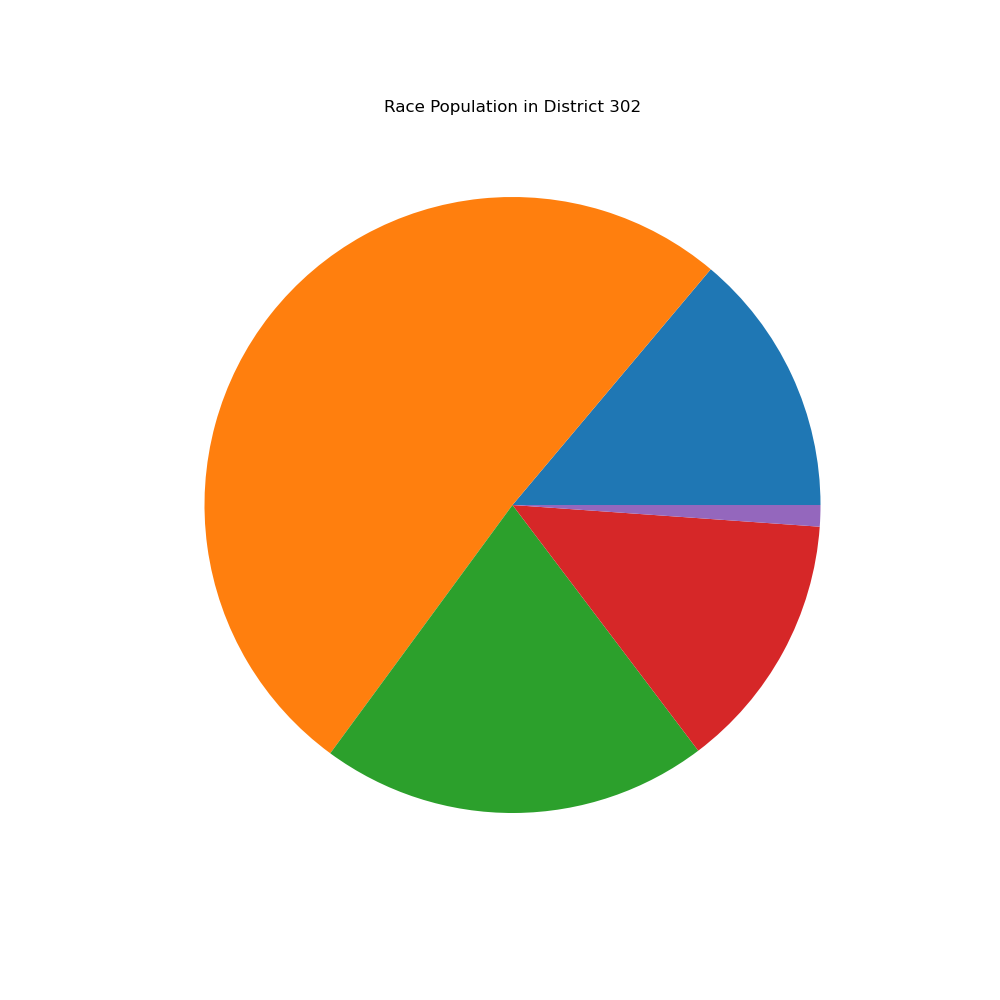
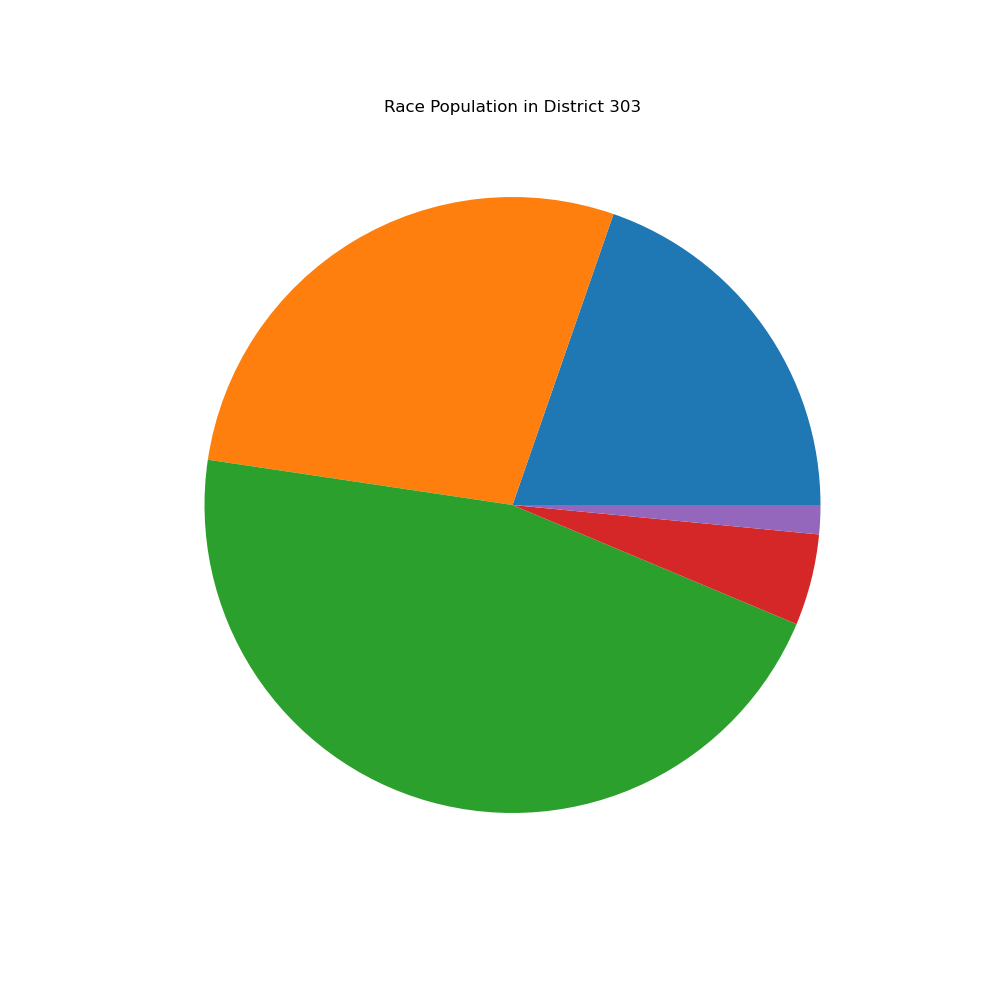
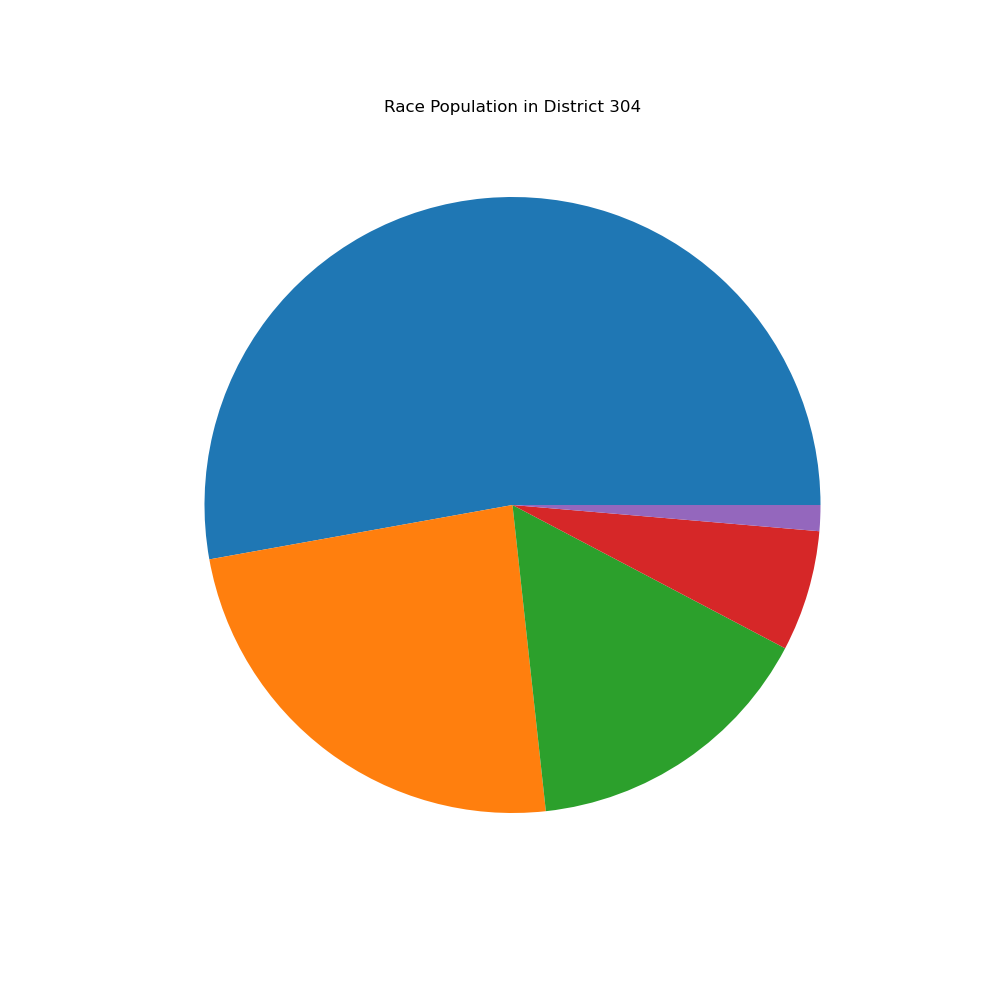
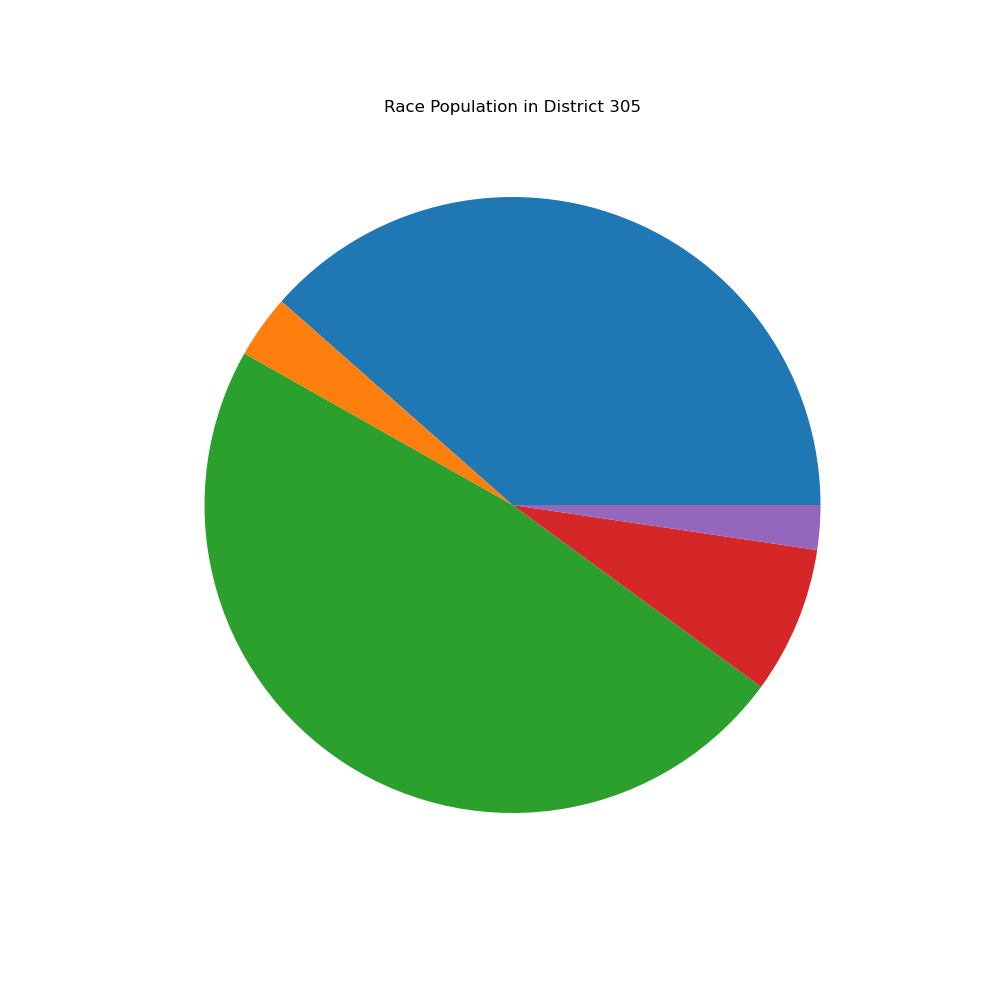
...
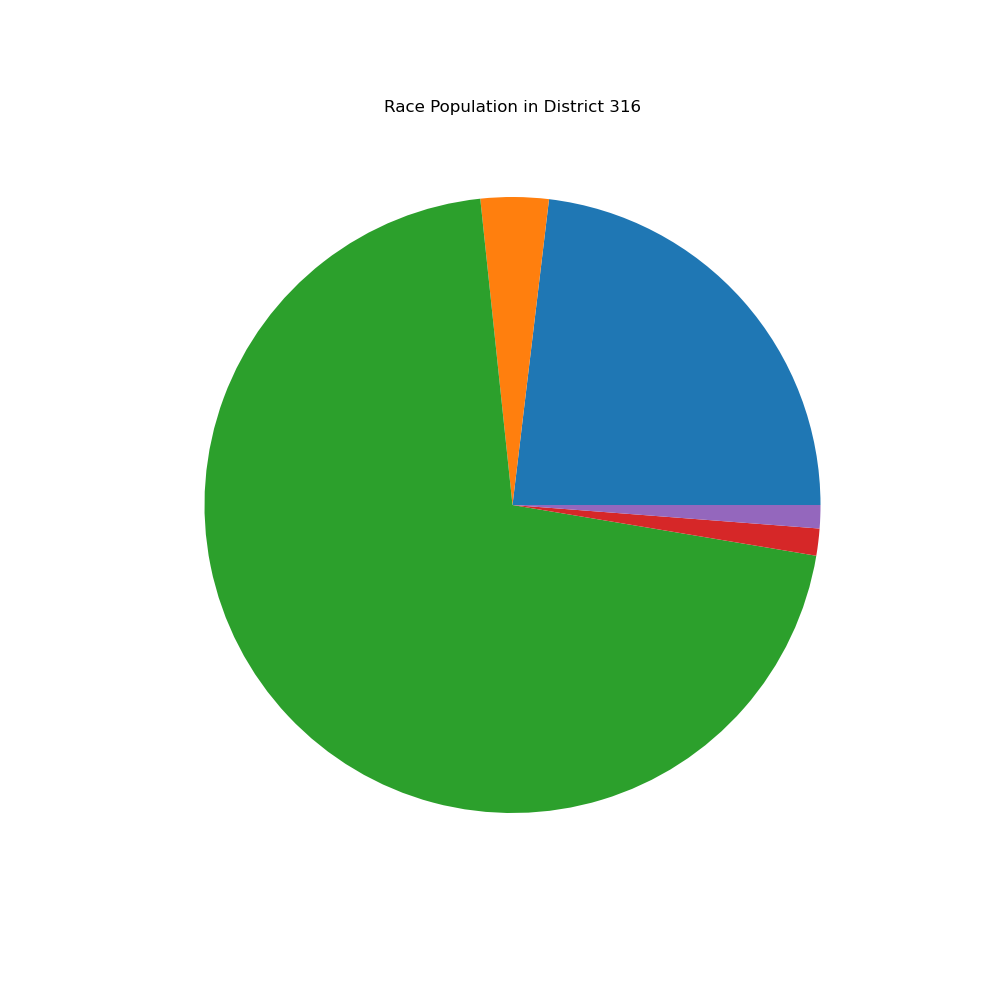
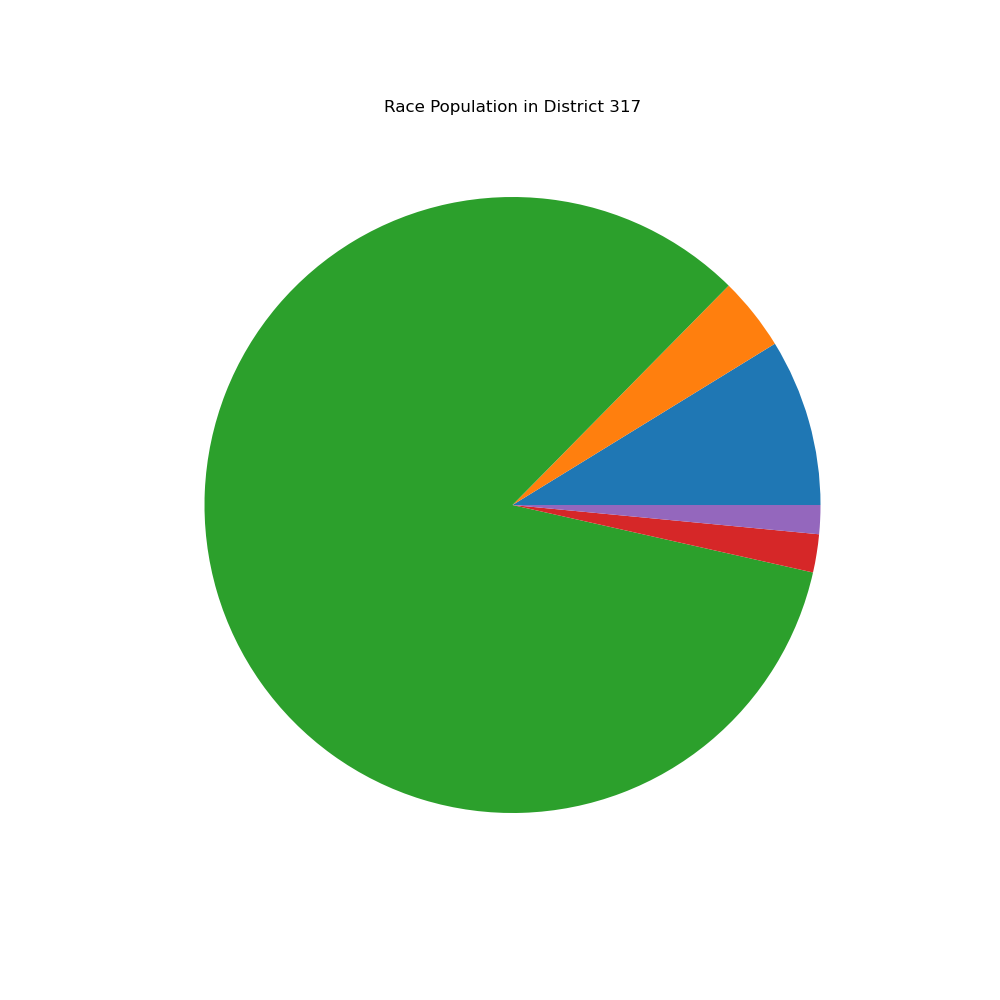
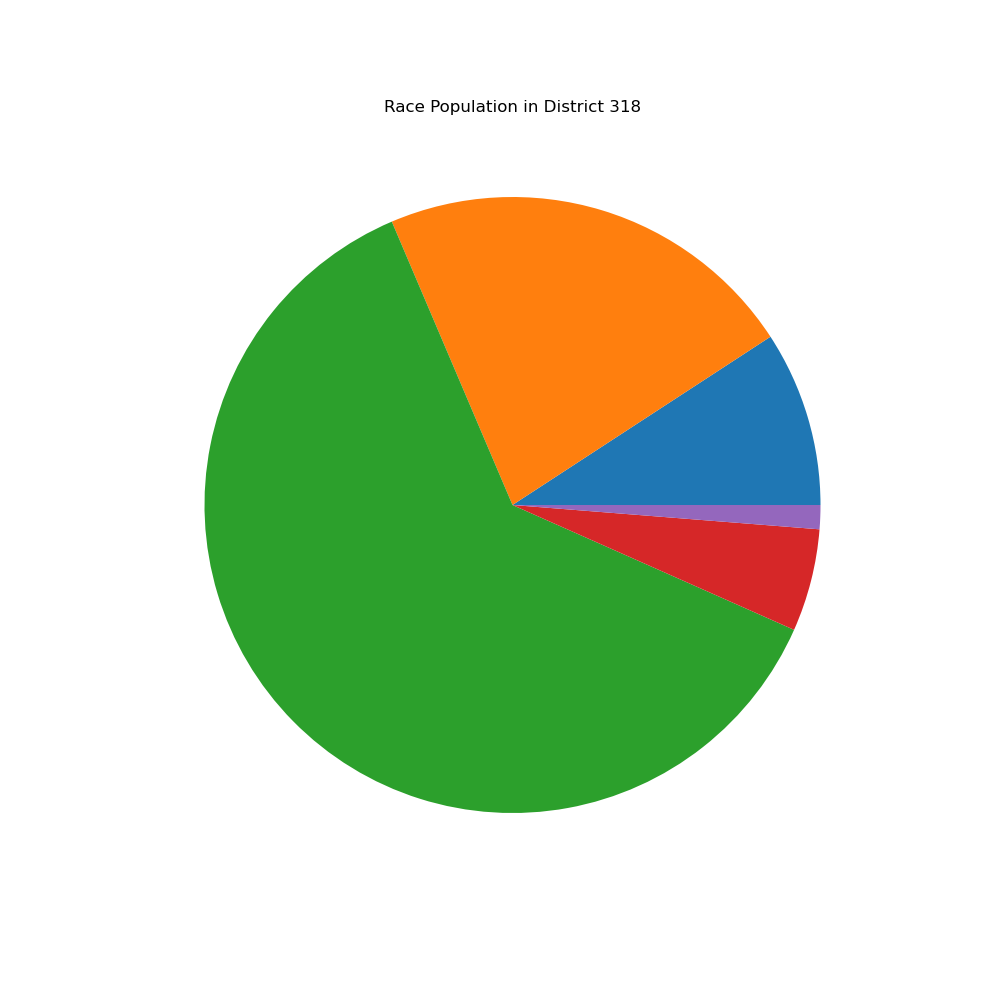
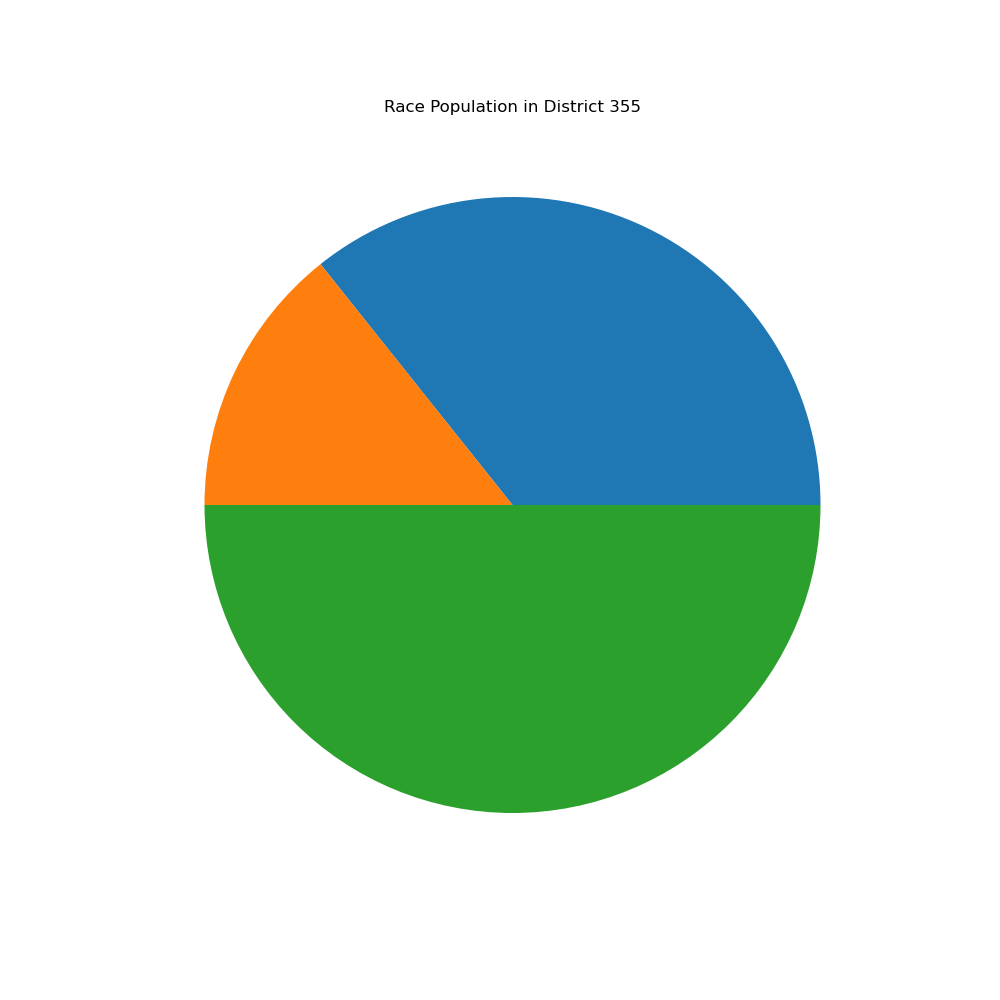
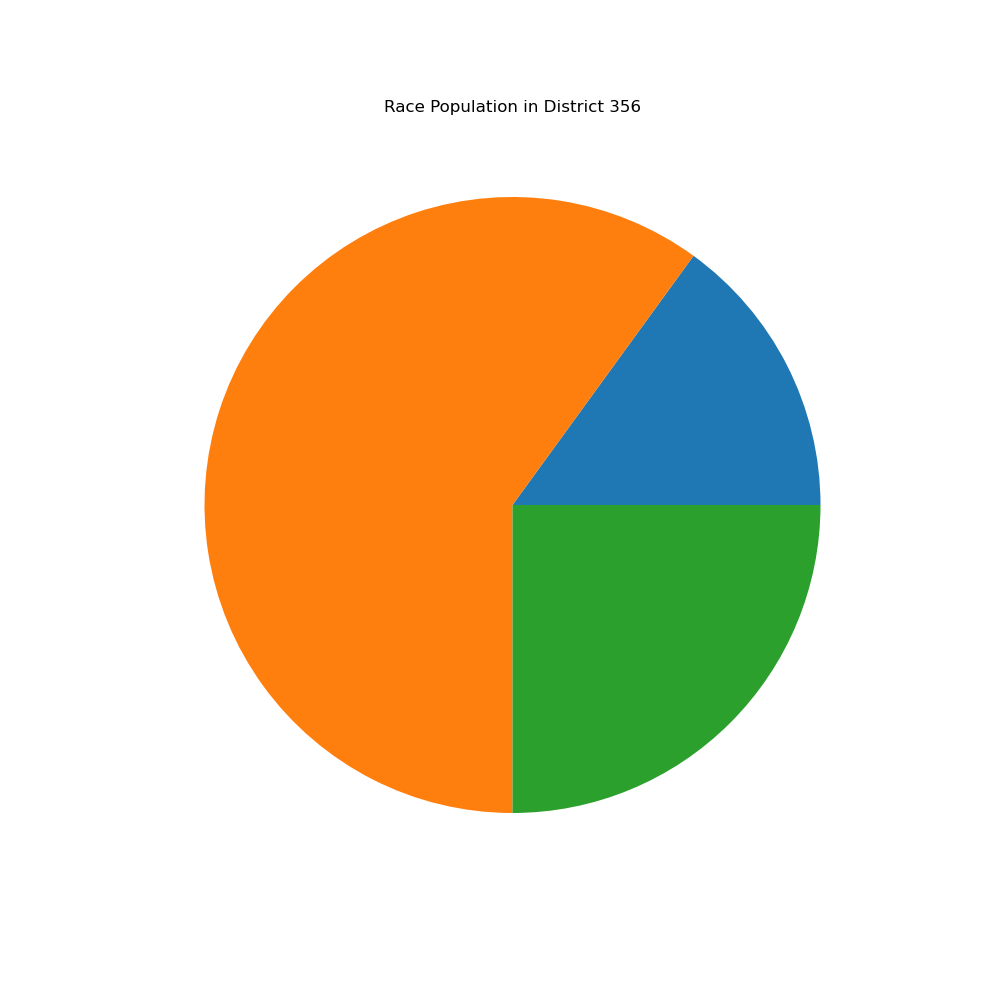

In [36]:
borough_brooklyn_district = {'type': 'FeatureCollection', 'features': []}

# Loop through the original districts
for district in NYC_district['features']:
    boro_cd = district['properties']['boro_cd']
    
    # Check if the boro_cd starts with '1' 
    if boro_cd.startswith('3'):
        # Append the district to the new dictionary
        borough_brooklyn_district['features'].append(district)

# Create an dictionary to store the coordinate
coordinate_dict_brooklyn = {}

for Geo_ID in race_population.keys():

    # Find corresponding district geo-center coordinates
    target_coordinates = None
    
    for feature in borough_brooklyn_district['features']:
        if int(feature['properties']['boro_cd'] ) == Geo_ID:
            target_coordinates = feature['geometry']['coordinates'][0][0]

            # Calculate average latitude and longitude
            total_lat, total_lon = 0, 0
            num_points = len(target_coordinates)

            for lat, lon in target_coordinates:
                total_lat += lat
                total_lon += lon

            avg_lat = total_lat / num_points
            avg_lon = total_lon / num_points

            coordinate_dict_brooklyn[Geo_ID] = [avg_lon,avg_lat]

            break

coordinate_dict_brooklyn[318] = [40.63182813322282, -73.9160132495719]  
coordinate_dict_brooklyn[315] = [40.601634423652115, -73.95827594262245]  
coordinate_dict_brooklyn[356] = [40.594083864183375, -73.8990253043261]  

# Create a map centered at New York City
Map_NYC = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='CartoDB positron')

#Add GeoJSON layer to the map
folium.GeoJson(
    borough_brooklyn_district,
    name='Brooklyn & race population',

    style_function= lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7
    }                                  
).add_to(Map_NYC)

for Geo_ID in coordinate_dict_brooklyn.keys():
   
    image_path = f'data/Race Pie Chart/district_{Geo_ID}_pie_chart.png'

    # Add the PNG image as a marker to the map
    icon = folium.CustomIcon(
    icon_image=image_path,
    icon_size=(70, 70)  # Adjust the size of the icon as needed
    )

    marker = folium.Marker(location=coordinate_dict_brooklyn.get(Geo_ID), icon=icon)
    marker.add_to(Map_NYC)

folium.map.Marker(location=[40.62365201763924, -73.92802911328235], icon=folium.DivIcon(html=f"<div style='font-size: 20pt'>Brooklyn</div>")).add_to(Map_NYC)

# Display the map
Map_NYC

### Racial Composition (via Pie Chart) of Each Precinct in Queens


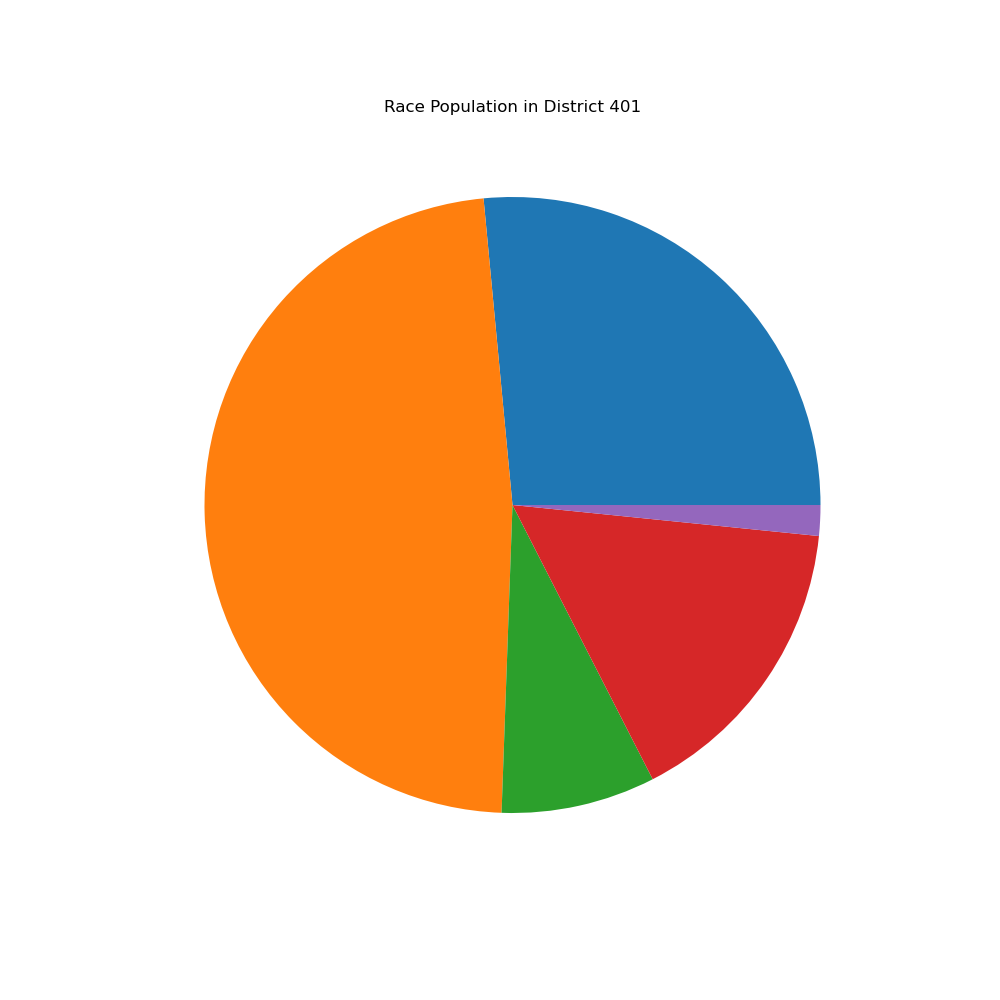
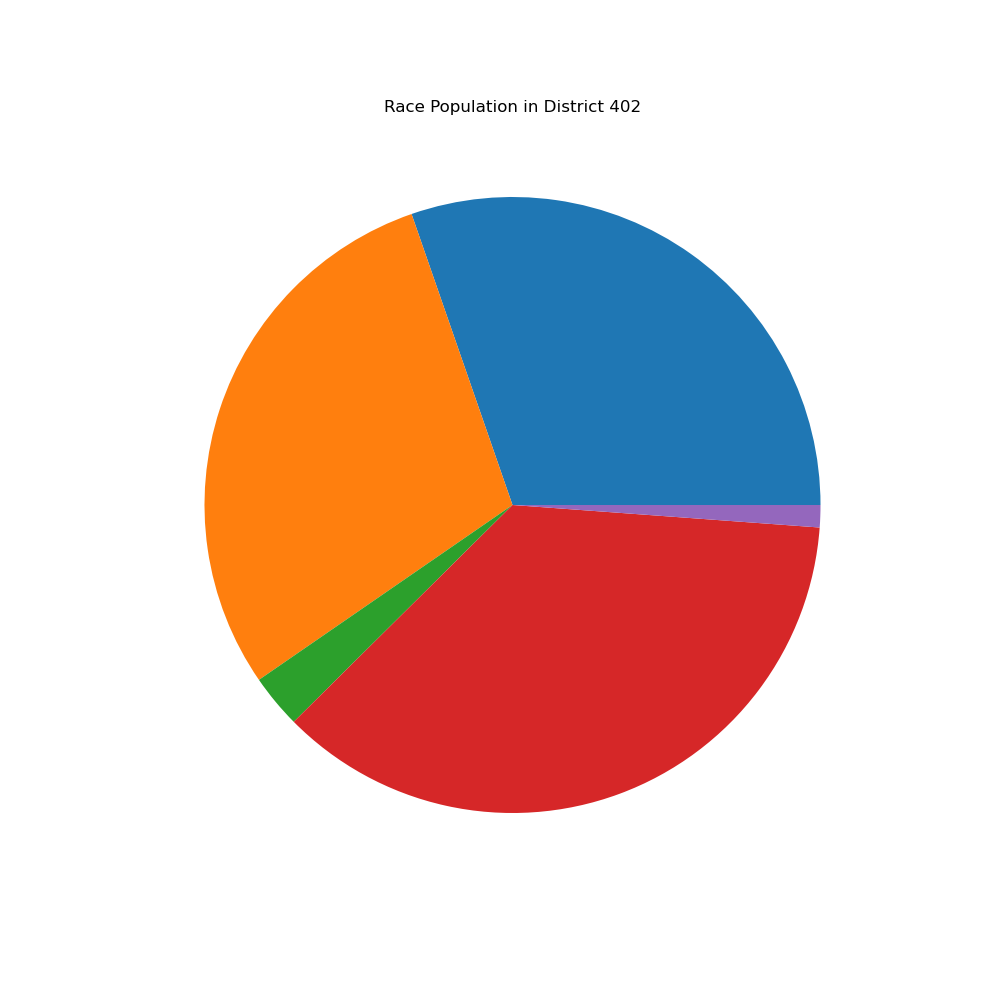
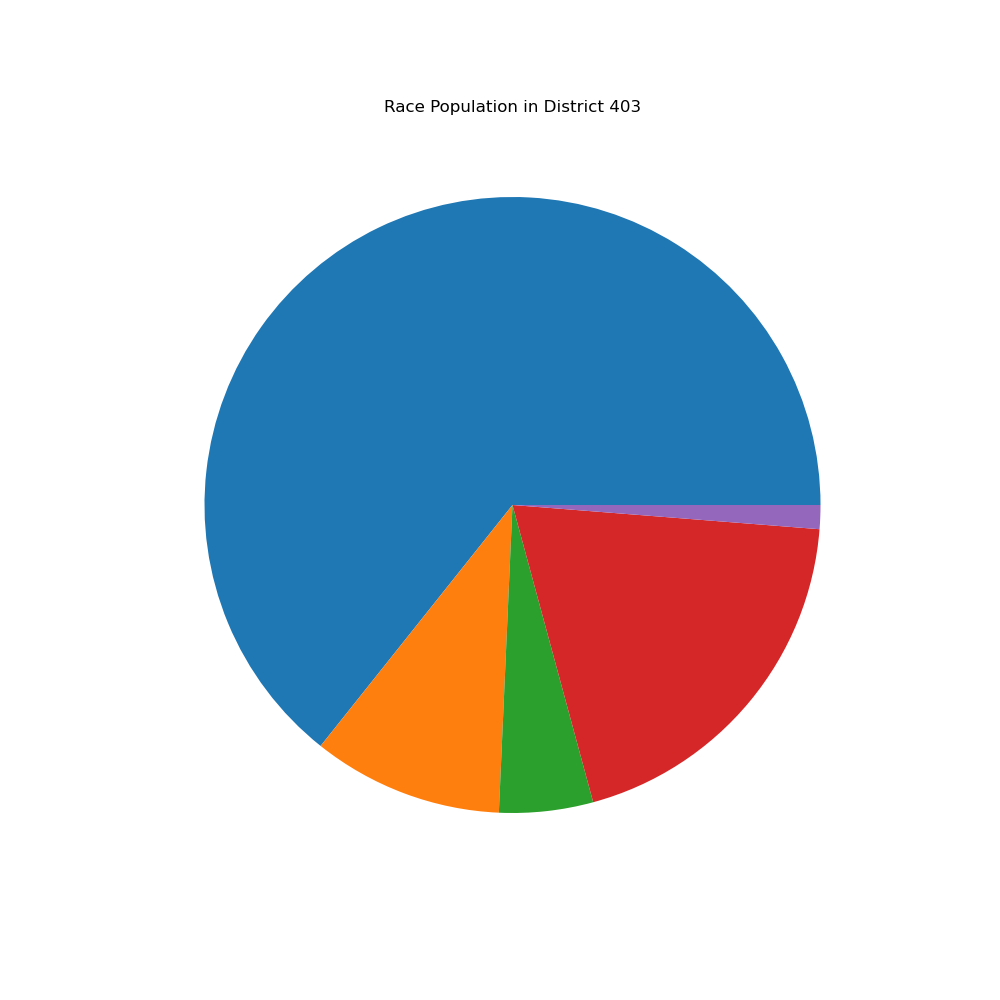
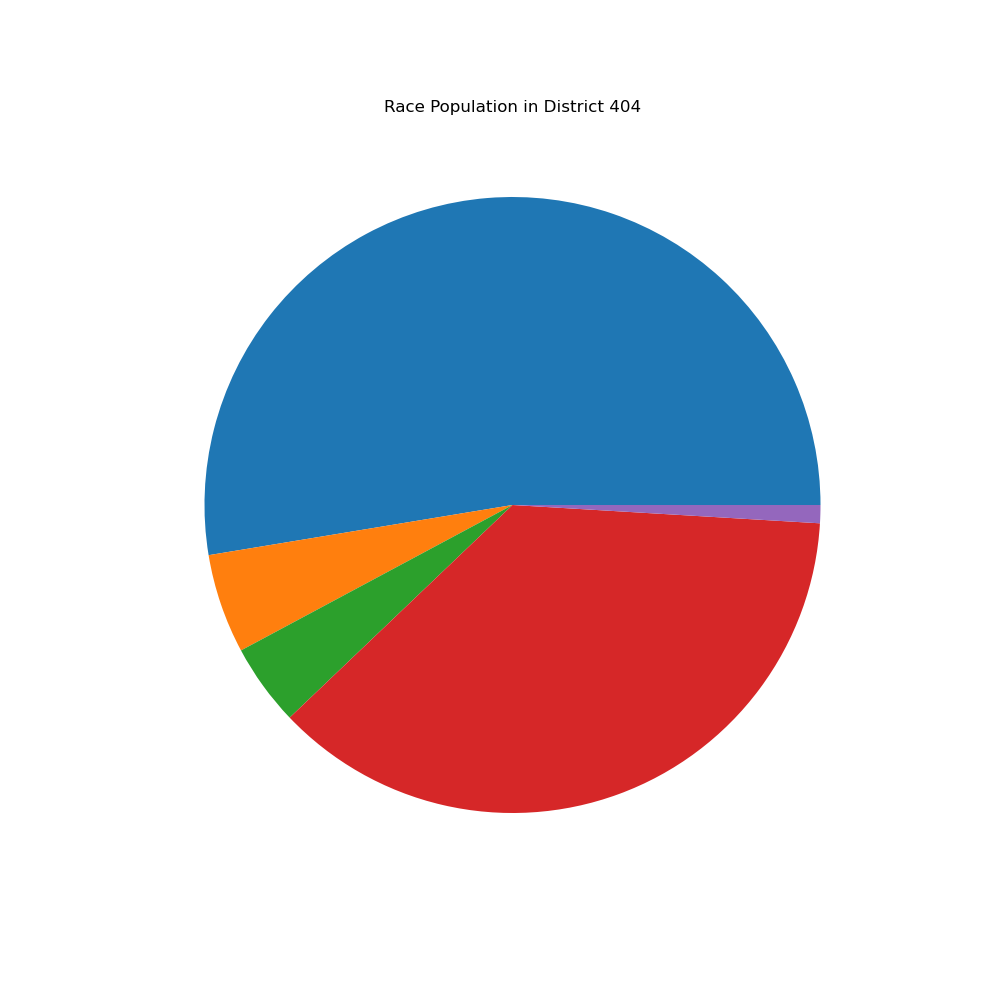
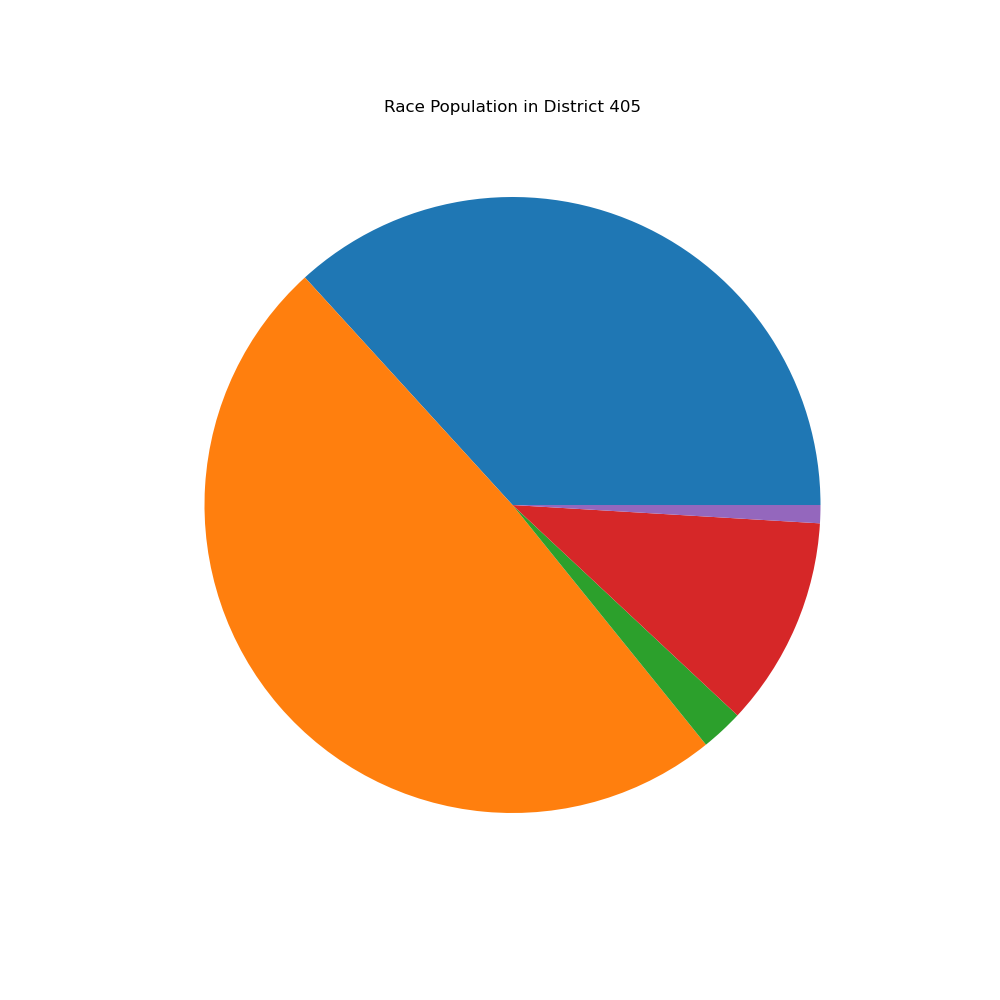
...
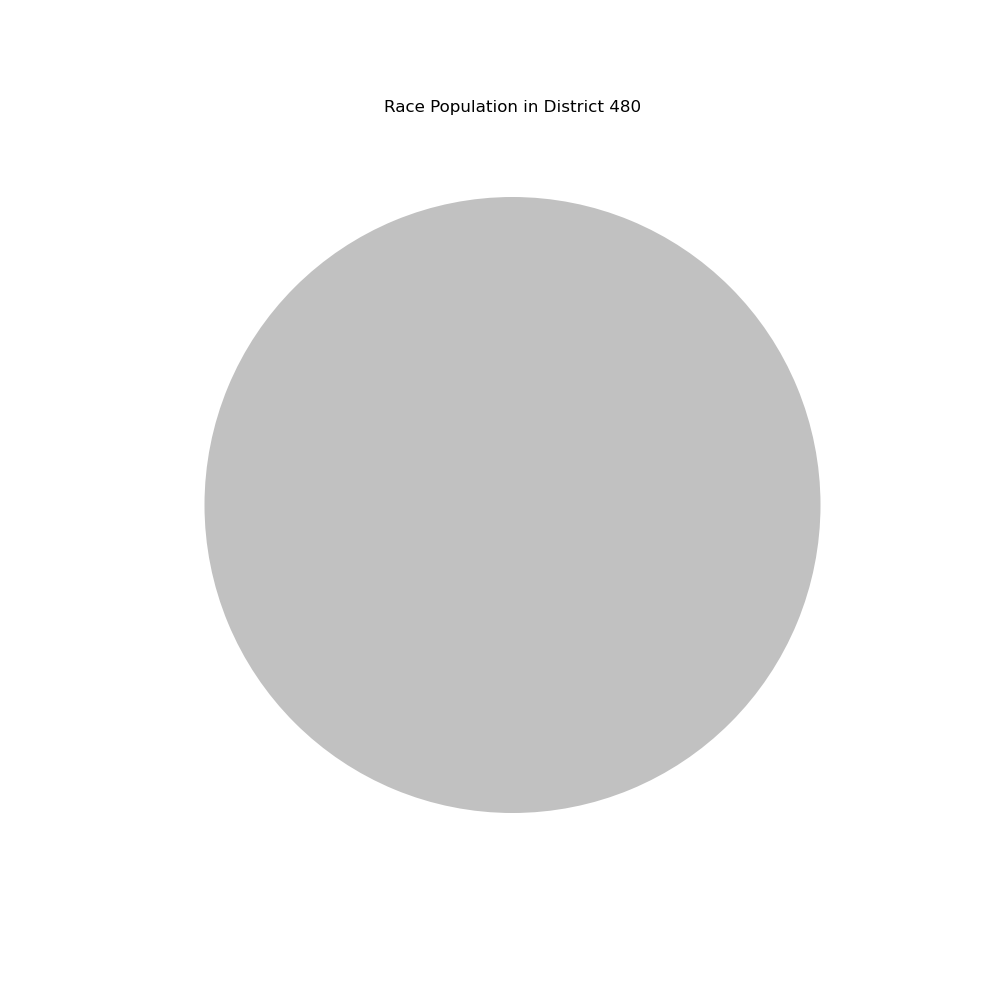
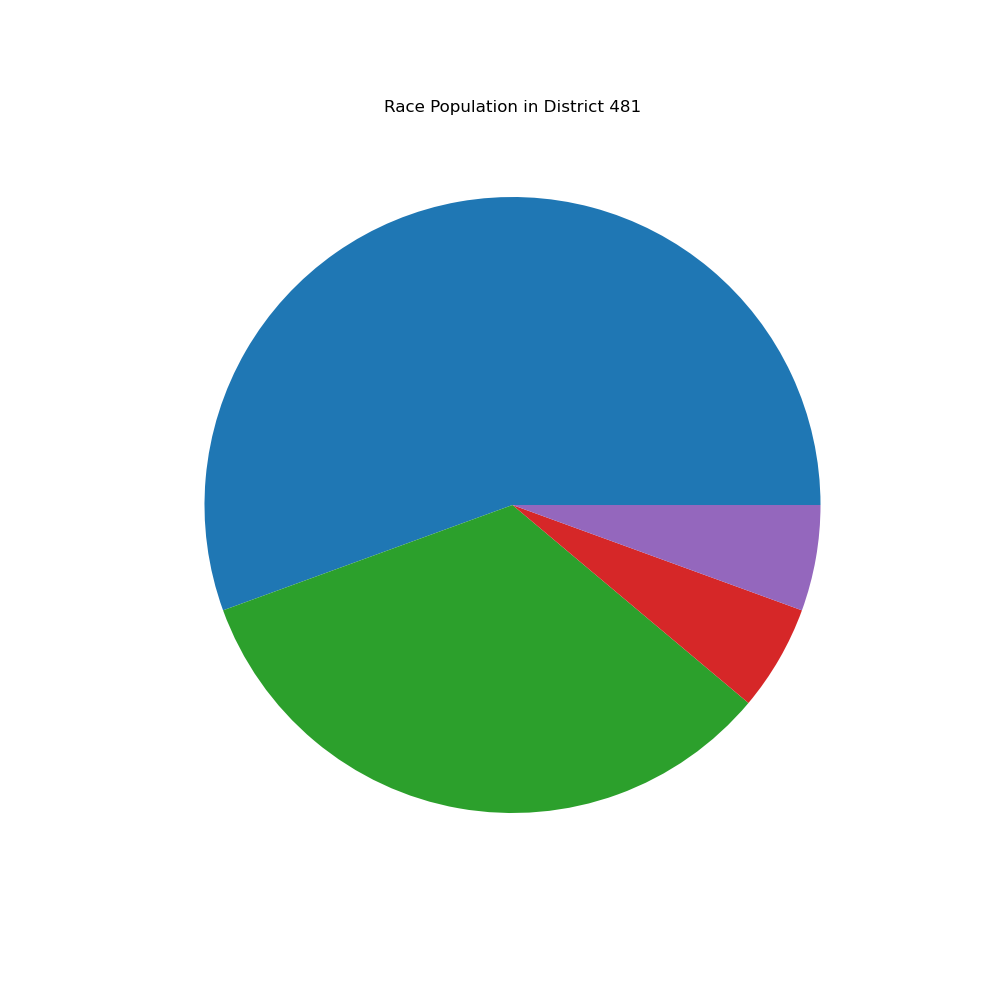
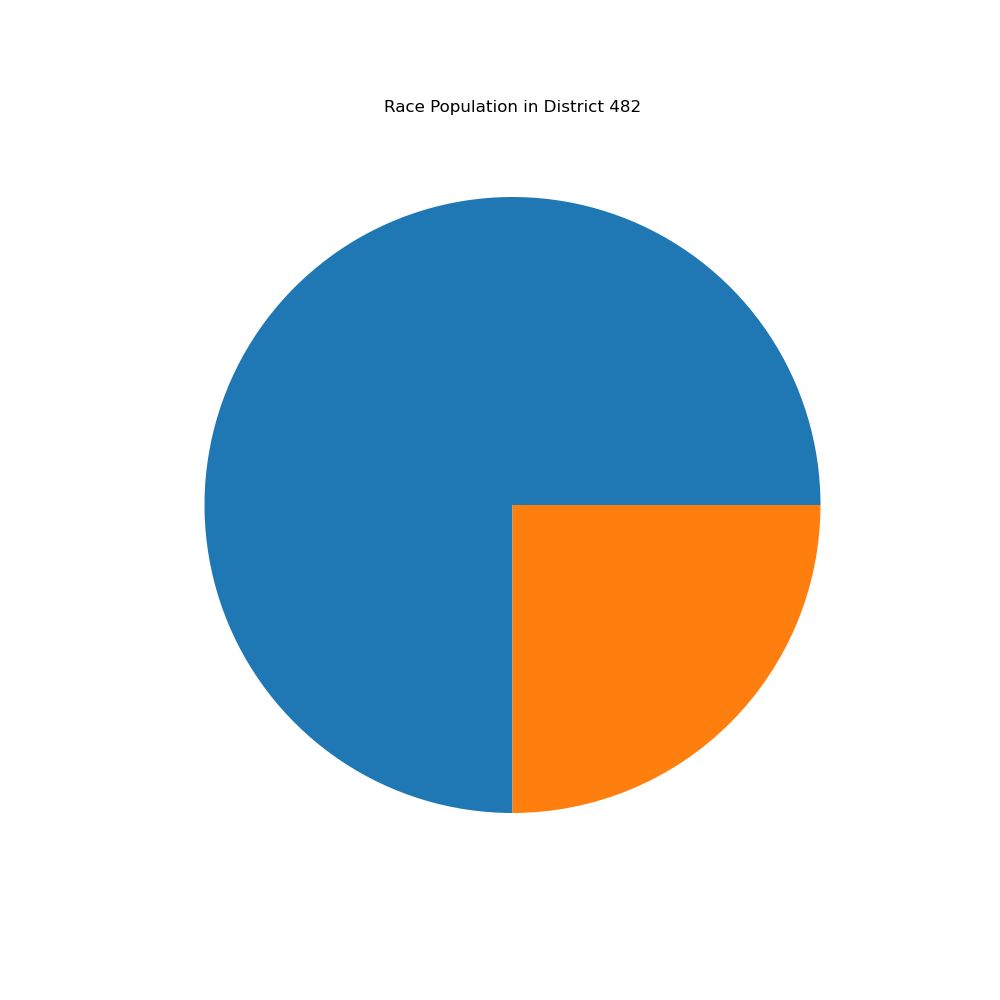
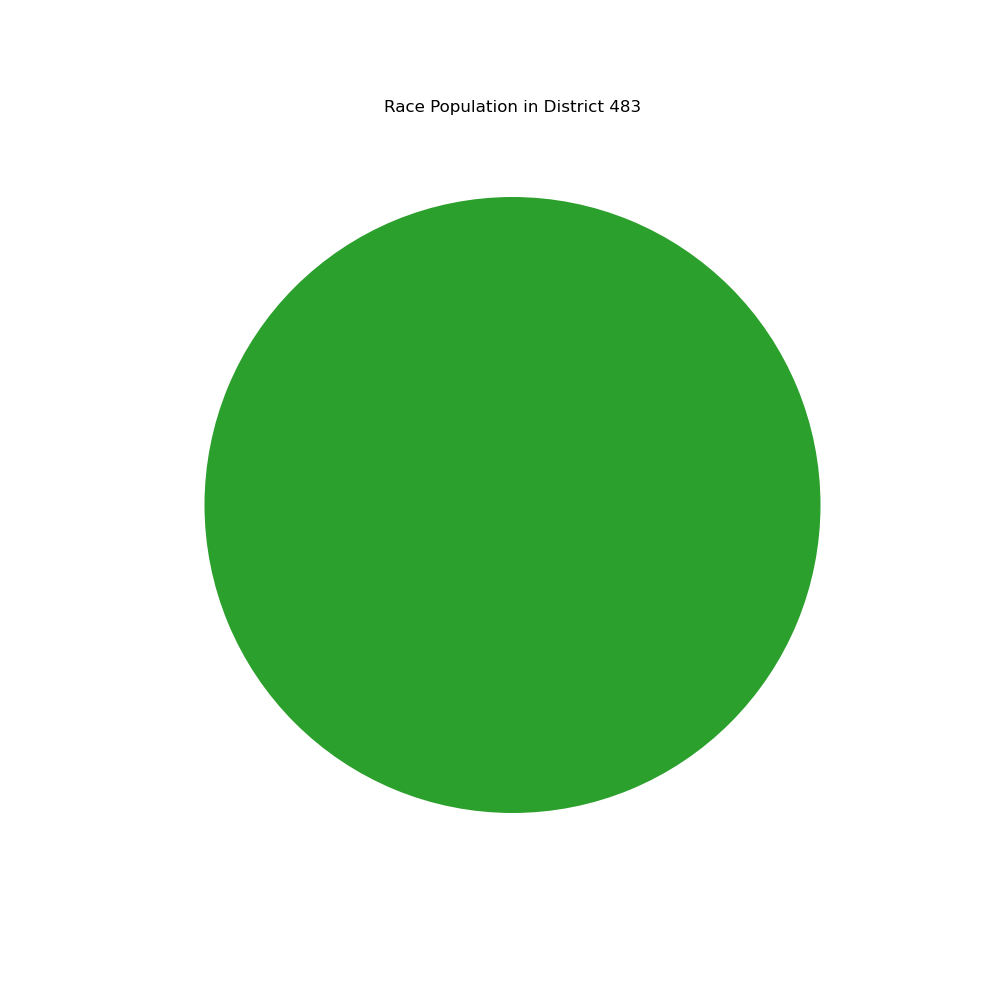
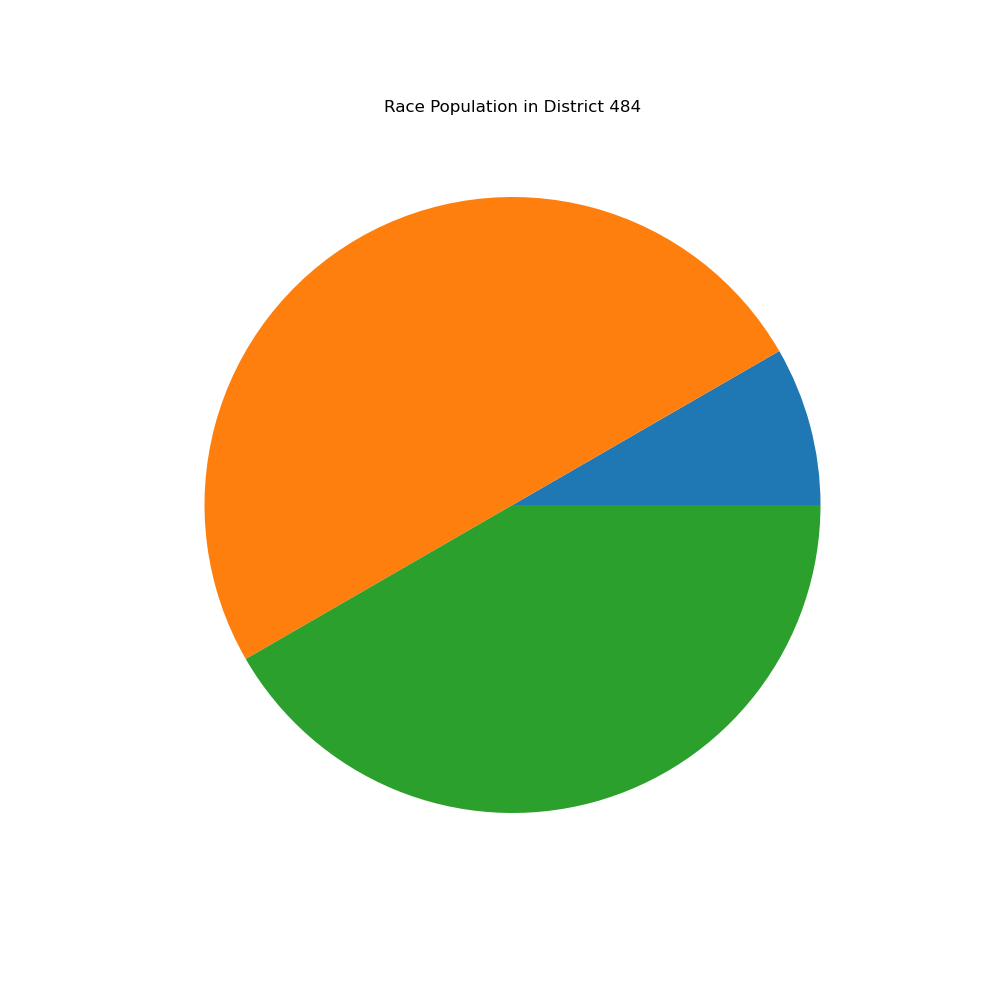

In [37]:
borough_queens_district = {'type': 'FeatureCollection', 'features': []}

# Loop through the original districts
for district in NYC_district['features']:
    boro_cd = district['properties']['boro_cd']
    
    # Check if the boro_cd starts with '1' 
    if boro_cd.startswith('4'):
        # Append the district to the new dictionary
        borough_queens_district['features'].append(district)

# Create an dictionary to store the coordinate
coordinate_dict_queens = {}

for Geo_ID in race_population.keys():

    # Find corresponding district geo-center coordinates
    target_coordinates = None
    
    for feature in borough_queens_district['features']:
        if int(feature['properties']['boro_cd'] ) == Geo_ID:
            target_coordinates = feature['geometry']['coordinates'][0][0]

            # Calculate average latitude and longitude
            total_lat, total_lon = 0, 0
            num_points = len(target_coordinates)

            for lat, lon in target_coordinates:
                total_lat += lat
                total_lon += lon

            avg_lat = total_lat / num_points
            avg_lon = total_lon / num_points

            coordinate_dict_queens[Geo_ID] = [avg_lon,avg_lat]

            break

coordinate_dict_queens[414] = [40.604288682847226, -73.80069055129738]  
coordinate_dict_queens[483] = [40.641329519636436, -73.76917299617097]  
coordinate_dict_queens[407] = [40.78379318088188, -73.82978939191027]  
coordinate_dict_queens[411] = [40.750929044451986, -73.76224785134347]  
coordinate_dict_queens[409] = [40.68934672481856, -73.82466605945868]  
coordinate_dict_queens[410] = [40.66874025352837, -73.81747804109227]  
        
# Create a map centered at New York City
Map_NYC = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='CartoDB positron')

#Add GeoJSON layer to the map
folium.GeoJson(
    borough_queens_district,
    name='Queens & race population',

    style_function= lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7
    }                                  
).add_to(Map_NYC)

for Geo_ID in coordinate_dict_queens.keys():
   
    image_path = f'data/Race Pie Chart/district_{Geo_ID}_pie_chart.png'

    # Add the PNG image as a marker to the map
    icon = folium.CustomIcon(
    icon_image=image_path,
    icon_size=(50, 50)  # Adjust the size of the icon as needed
    )

    marker = folium.Marker(location=coordinate_dict_queens.get(Geo_ID), icon=icon)
    marker.add_to(Map_NYC)

folium.map.Marker(location=[40.69877169315224, -73.73246056944078], icon=folium.DivIcon(html=f"<div style='font-size: 20pt'>Queens</div>")).add_to(Map_NYC)
folium.map.Marker(location=[40.65598584255778, -73.80069055129738], icon=folium.DivIcon(html=f"<div style='font-size: 8pt'>JFK Airport</div>")).add_to(Map_NYC)

# Display the map
Map_NYC

### Racial Composition (via Pie Chart) of Each Precinct in Staten Island


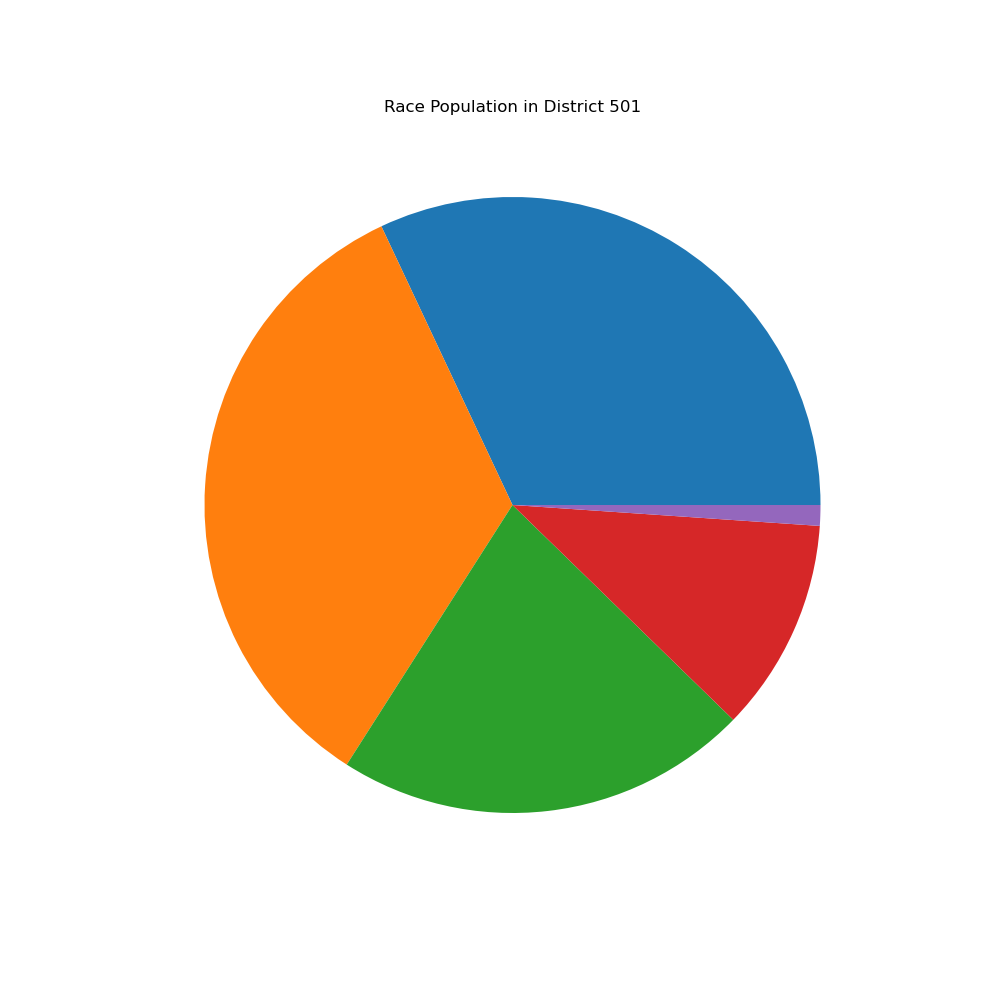
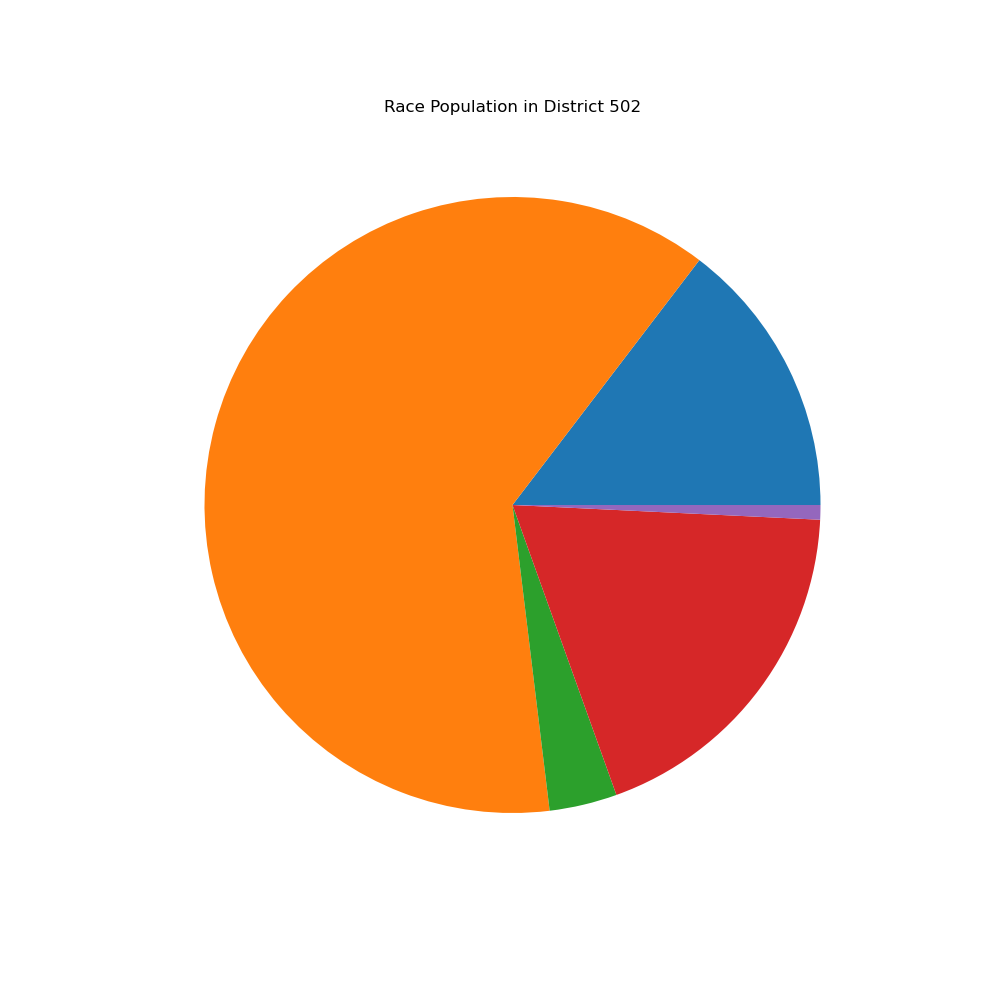
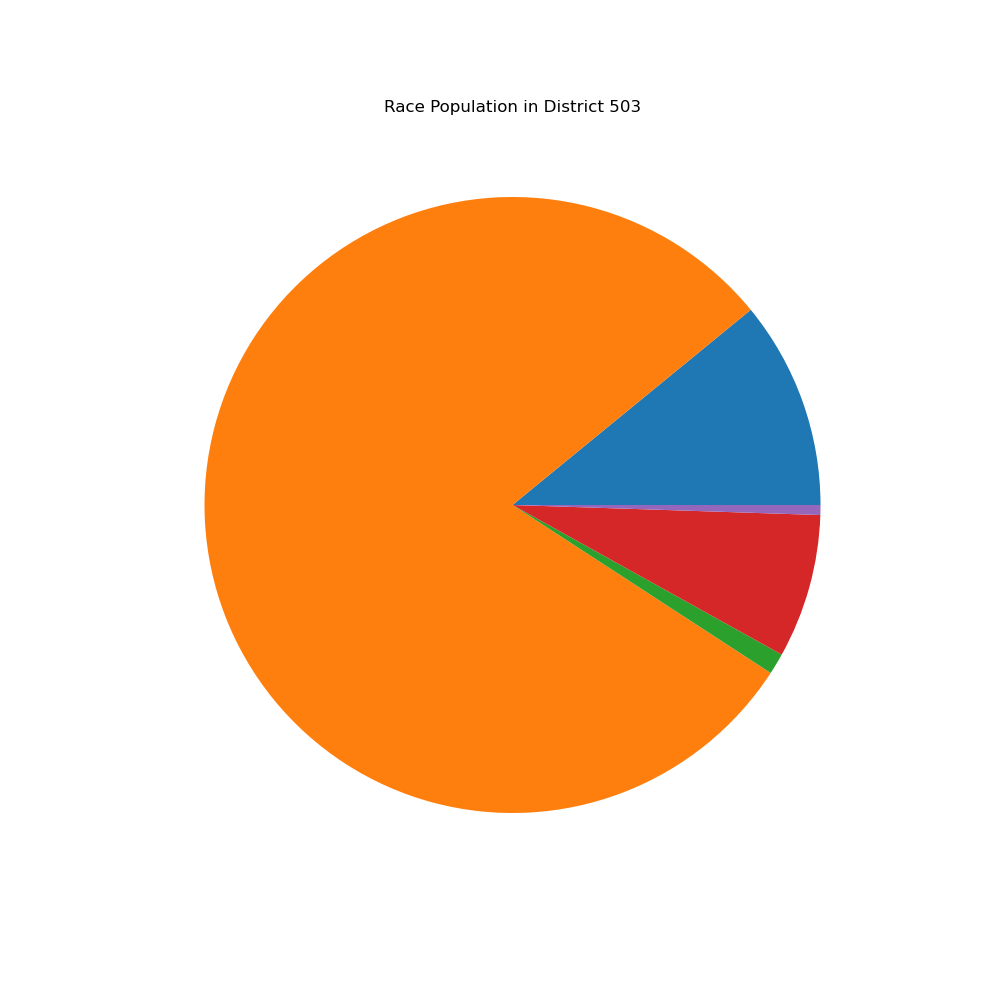
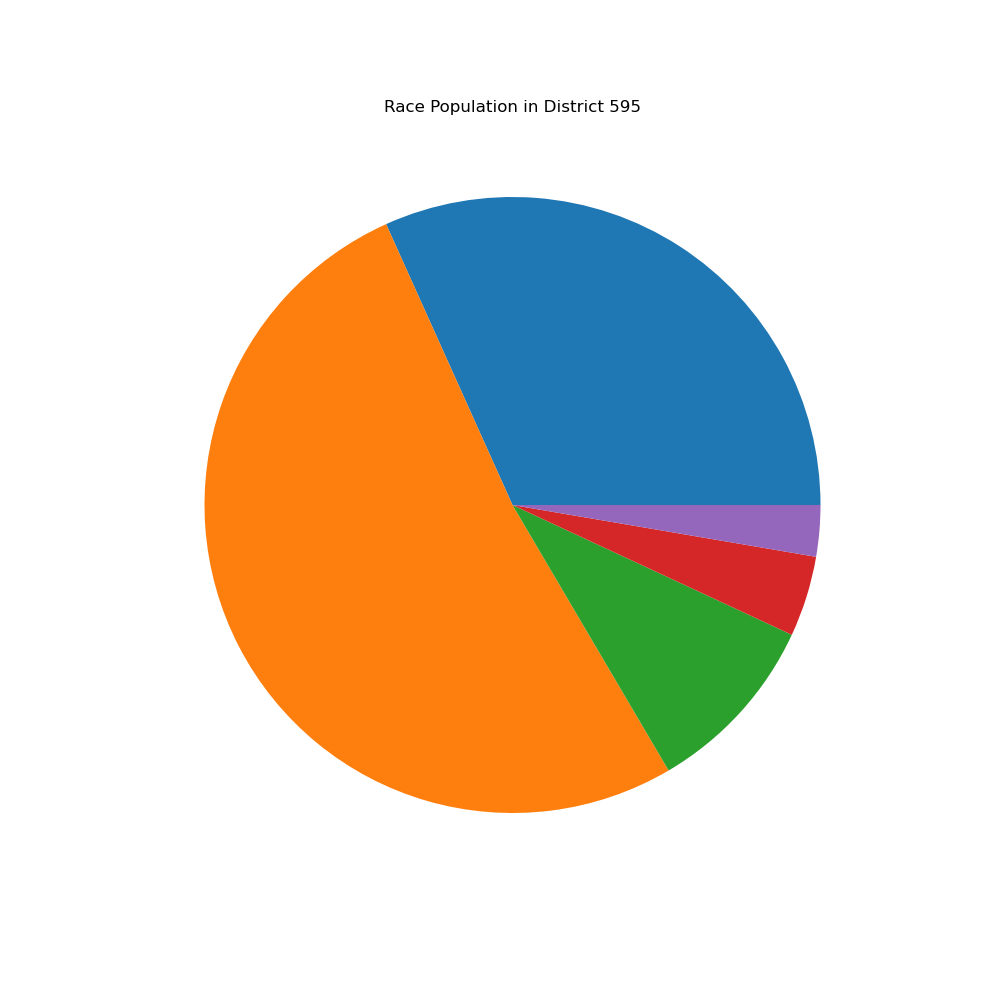

In [38]:
borough_statenisland_district = {'type': 'FeatureCollection', 'features': []}

# Loop through the original districts
for district in NYC_district['features']:
    boro_cd = district['properties']['boro_cd']
    
    # Check if the boro_cd starts with '1' 
    if boro_cd.startswith('5'):
        # Append the district to the new dictionary
        borough_statenisland_district['features'].append(district)

# Create an dictionary to store the coordinate
coordinate_dict_statenisland = {}

for Geo_ID in race_population.keys():

    # Find corresponding district geo-center coordinates
    target_coordinates = None
    
    for feature in borough_statenisland_district['features']:
        if int(feature['properties']['boro_cd'] ) == Geo_ID:
            target_coordinates = feature['geometry']['coordinates'][0][0]

            # Calculate average latitude and longitude
            total_lat, total_lon = 0, 0
            num_points = len(target_coordinates)

            for lat, lon in target_coordinates:
                total_lat += lat
                total_lon += lon

            avg_lat = total_lat / num_points
            avg_lon = total_lon / num_points



            coordinate_dict_statenisland[Geo_ID] = [avg_lon,avg_lat]

            break


coordinate_dict_statenisland[502] = [40.582360331598665, -74.1584212242192]
coordinate_dict_statenisland[503] = [40.53116691857635, -74.2152738120203]

# Create a map centered at New York City
Map_NYC = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='CartoDB positron')

#Add GeoJSON layer to the map
folium.GeoJson(
    borough_statenisland_district,
    name='Staten Island & race population',

    style_function= lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.7
    }                                  
).add_to(Map_NYC)

for Geo_ID in coordinate_dict_statenisland.keys():
   
    image_path = f'data/Race Pie Chart/district_{Geo_ID}_pie_chart.png'

    # Add the PNG image as a marker to the map
    icon = folium.CustomIcon(
    icon_image=image_path,
    icon_size=(50, 50)  # Adjust the size of the icon as needed
    )

    marker = folium.Marker(location=coordinate_dict_statenisland.get(Geo_ID), icon=icon)
    marker.add_to(Map_NYC)

# Display the map
Map_NYC